# NETW 1013 Clustering Project

**Objective:**
The objective of this project is to teach students how to apply clustering to real datasets.

You should be able to answer the following questions and provide reasonable justification for your answers:
* Which clustering approach have you decided to use on each dataset?
* Compare between Kmeans, Hierarchal and DBScan.
* Discuss how you tuned your clustering hyperparameters to achieve the best cluster assignment?
* What is the effect of different distance functions on the calculated clusters?
* How did you evaluate the performance of different clustering techniques on different datatsets?
* Visualize your output where applicable.
* What is the effect of scaling on the performance of clustering techniques?






Running this project requires the following imports:

In [7]:
import warnings
warnings.filterwarnings('ignore')
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import sklearn.preprocessing as prep
from sklearn.datasets import make_blobs
from plotnine import *
# StandardScaler is a function to normalize the data
# You may also check MinMaxScaler and MaxAbsScaler
from sklearn.preprocessing import StandardScaler

from sklearn.cluster import DBSCAN


from sklearn.cluster import KMeans

from sklearn.metrics import silhouette_score

%matplotlib inline
# Please refer to the sklearn documentation to learn more about the different parameters for each clustering technique.

In [8]:
# helper function that allows us to display data in 2 dimensions an highlights the clusters
def display_cluster(X,km=[],num_clusters=0):
    color = 'brgcmyk'  #List colors
    alpha = 0.5
    s = 20
    if num_clusters == 0:
        plt.scatter(X[:,0],X[:,1],c = color[0],alpha = alpha,s = s)
    else:
        for i in range(num_clusters):
            plt.scatter(X[km.labels_==i,0],X[km.labels_==i,1],c = color[i],alpha = alpha,s=s)
            plt.scatter(km.cluster_centers_[i][0],km.cluster_centers_[i][1],c = color[i], marker = 'x', s = 100)

## Multi Blob Data Set
* The dataset generated below is known to be best clustered into 6 clusters.
* Cluster the data set below using the three different clustering techniques discussed in the course.
* Visualize your clustering output in each step of your work.



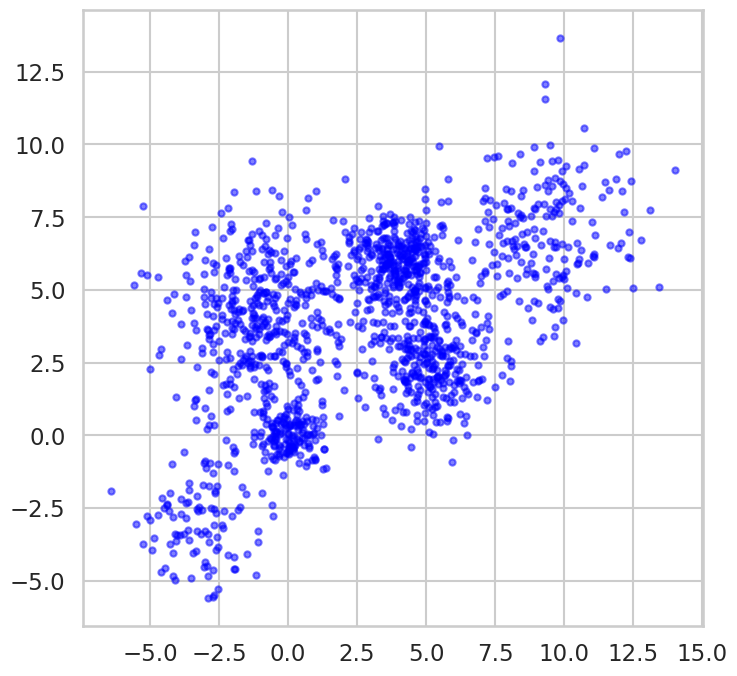

In [9]:
#Data Generation and Visualization
plt.rcParams['figure.figsize'] = [8,8]
sns.set_style("whitegrid")
sns.set_context("talk")

n_bins = 6
centers = [(-3, -3), (0, 0), (5,2.5),(-1, 4), (4, 6), (9,7)]
Multi_blob_Data, y = make_blobs(n_samples=[100,150, 300, 400,300, 200], n_features=2, cluster_std=[1.3,0.6, 1.2, 1.7,0.9,1.7],
                  centers=centers, shuffle=False, random_state=42)
display_cluster(Multi_blob_Data)

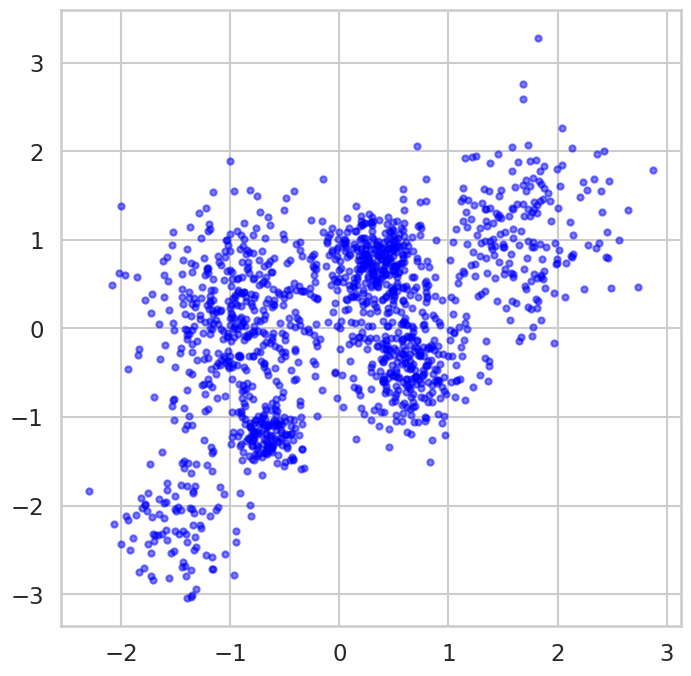

In [10]:
#Features with larger values can dominate the distance calculations or gradient updates, leading to suboptimal performance
#so using standardScaler will improve the performance of the algorithim by Transformation and Scaling
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaled = scaler.fit_transform(Multi_blob_Data)
display_cluster(scaled)

### Kmeans
* Use Kmeans with different values of K to cluster the above data.
* Display the outcome of each value of K.
* Plot distortion function versus K and choose the approriate value of K.
* Plot the silhouette_score versus K and use it to choose the best K.
* Store the silhouette_score for the best K for later comparison with other clustering techniques.
* Comment on the effect of centroid initialization on cluster assignment.
* Hint: Lookup k-means++ .


K-Means Clustering with K = 2:

K-Means Clustering with K = 3:

K-Means Clustering with K = 4:

K-Means Clustering with K = 5:

K-Means Clustering with K = 6:

K-Means Clustering with K = 7:


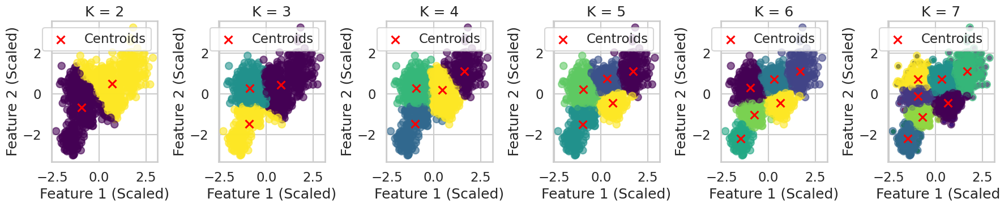

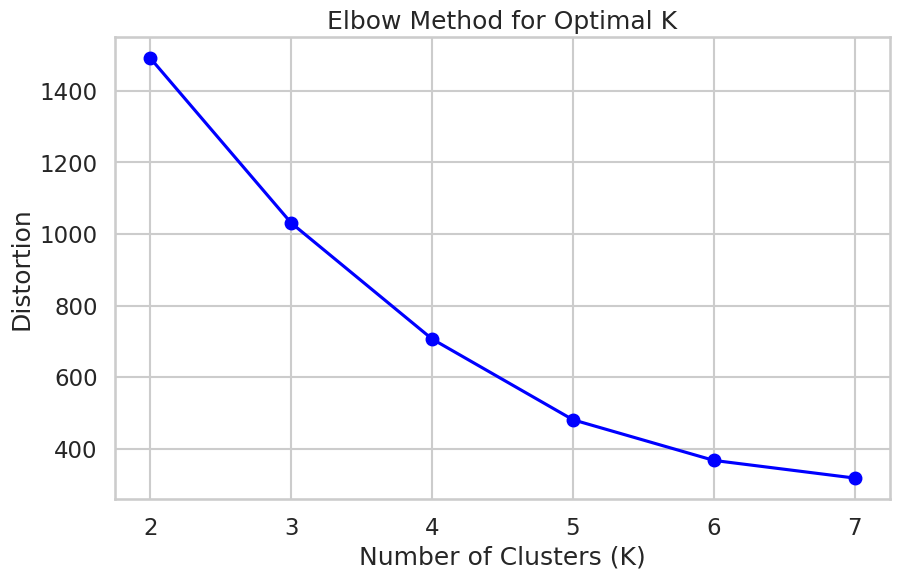

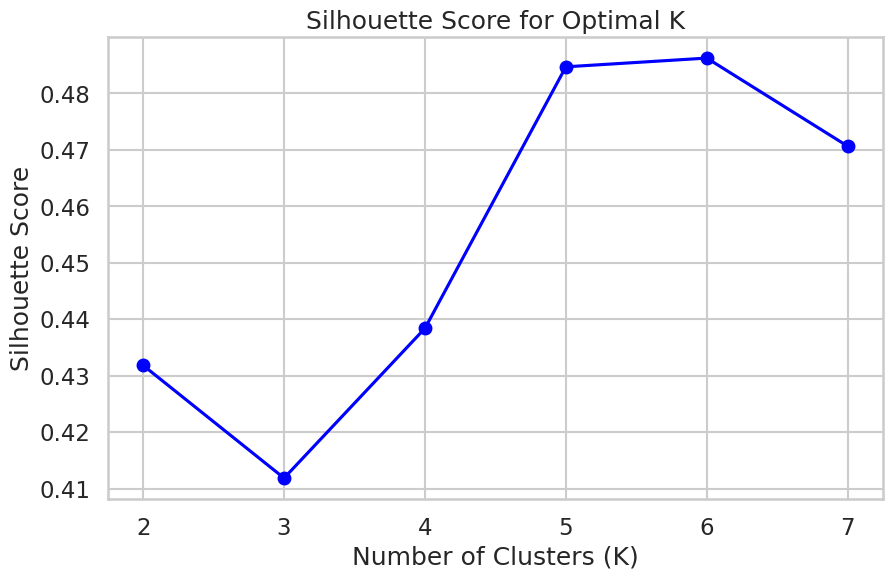


Optimal K based on Silhouette Score: 6 with a score of 0.4863


In [11]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

# Use Kmeans with different values of K, limiting K to the number of colors
max_k = len('brgcmyk')
k_values = range(2, max_k + 1)  # Ensure K does not exceed the number of colors
distortions = []
silhouette_scores = []
kmeans_models = {}

fig, axes = plt.subplots(1, len(k_values), figsize=(18, 4)) # Adjust for the number of k values

for i, k in enumerate(k_values):
    # Initialize KMeans with k clusters, using k-means++ for smart initialization
    kmeans = KMeans(n_clusters=k, init='k-means++', n_init=10, random_state=42)
    kmeans.fit(scaled)
    kmeans_models[k] = kmeans
    distortions.append(kmeans.inertia_)  # Sum of squared distances of samples to their closest cluster center
    silhouette_avg = silhouette_score(scaled, kmeans.labels_)
    silhouette_scores.append(silhouette_avg)
    print(f"\nK-Means Clustering with K = {k}:")
    display_cluster(scaled, kmeans, num_clusters=k) # Keep individual plots

    ax = axes[i]  # Access the correct subplot
    cluster_labels = kmeans.labels_
    cluster_centers = kmeans.cluster_centers_
    ax.scatter(scaled[:, 0], scaled[:, 1], c=cluster_labels, cmap='viridis', alpha=0.6)
    ax.scatter(cluster_centers[:, 0], cluster_centers[:, 1], c='red', marker='x', s=100, label='Centroids')
    ax.set_title(f'K = {k}')
    ax.set_xlabel('Feature 1 (Scaled)')
    ax.set_ylabel('Feature 2 (Scaled)')
    ax.legend()

plt.tight_layout()
plt.show()

# Plot distortion function versus K and choose the appropriate value of K (Elbow Method)
plt.figure(figsize=(10, 6))
plt.plot(k_values, distortions, 'bo-')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Distortion')
plt.title('Elbow Method for Optimal K')
plt.xticks(k_values)
plt.grid(True)
plt.show()

# Plot the silhouette_score versus K and use it to choose the best K
plt.figure(figsize=(10, 6))
plt.plot(k_values, silhouette_scores, 'bo-')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score for Optimal K')
plt.xticks(k_values)
plt.grid(True)
plt.show()

# Choose the best K based on silhouette score
best_k_silhouette = k_values[np.argmax(silhouette_scores)]
best_silhouette_score = np.max(silhouette_scores)
print(f"\nOptimal K based on Silhouette Score: {best_k_silhouette} with a score of {best_silhouette_score:.4f}")

# Store the silhouette_score for the best K
kmeans_silhouette_score = best_silhouette_score



In [ ]:
#The initial placement of centroids in K-Means can significantly impact the final cluster assignments and the overall quality of the clustering. A poor initialization can lead to:
#Convergence to a suboptimal local minimum of the within-cluster sum of squares (distortion).
#Different runs of the algorithm with the same K potentially yielding different clustering results.
#Slower convergence.

#The 'k-means++' initialization technique (used here with `init='k-means++'`) addresses this issue by intelligently
#seeding the initial centroids. It aims to select initial centroids that are far from each other, which generally leads to:
#A higher chance of finding a better clustering solution.
#More consistent results across different runs.
#Faster convergence.
#Without a smart initialization strategy like random initialization, the algorithm might get stuck in a less optimal configuration, e
#specially with complex datasets or a poor initial guess of centroid locations

### Hierarchal Clustering
* Use AgglomerativeClustering function to  to cluster the above data.
* In the  AgglomerativeClustering change the following parameters:
    * Affinity (use euclidean, manhattan and cosine)
    * Linkage(try different options)
    * Distance_threshold (try different options)
* Plot the dendrograph for one trial.
* For each of these trials, calculate the silhouette_score and display the resulting clusters.  
* Find the set of paramters that would find result in the best silhouette_score and store this score for later comparison with other clustering techniques.
* Record your observation.

Silhouette Score for affinity=euclidean, linkage=average, distance_threshold=2: 0.3622226549861079


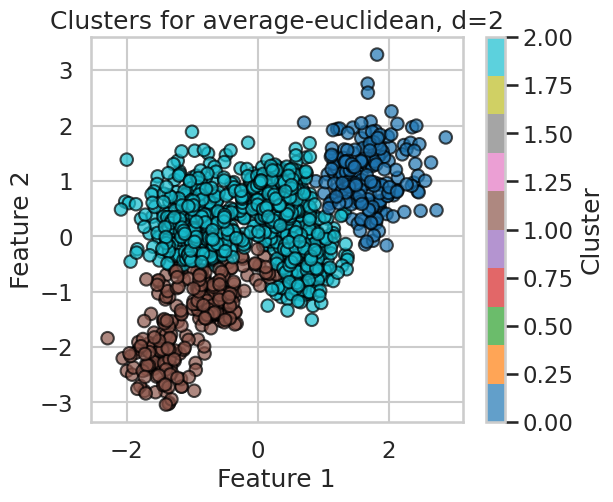

Silhouette Score for affinity=euclidean, linkage=complete, distance_threshold=2: 0.39493608021759763


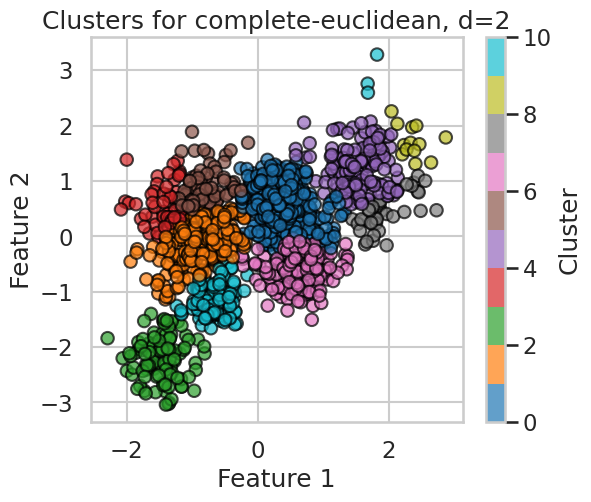

Silhouette Score for affinity=euclidean, linkage=complete, distance_threshold=5: 0.36736567022241734


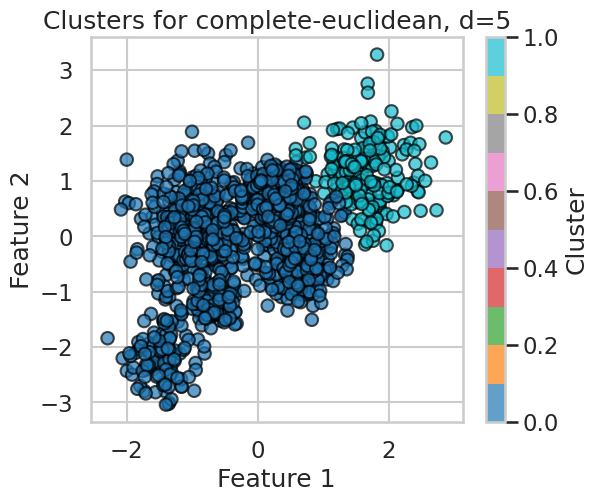

Silhouette Score for affinity=euclidean, linkage=ward, distance_threshold=2: 0.2932048099558007


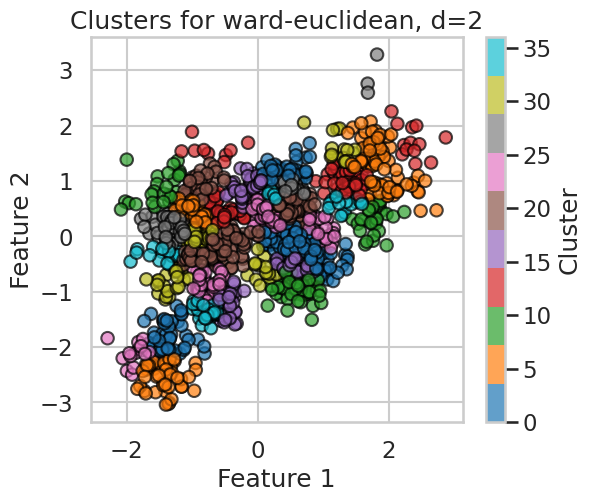

Silhouette Score for affinity=euclidean, linkage=ward, distance_threshold=5: 0.33359511221490185


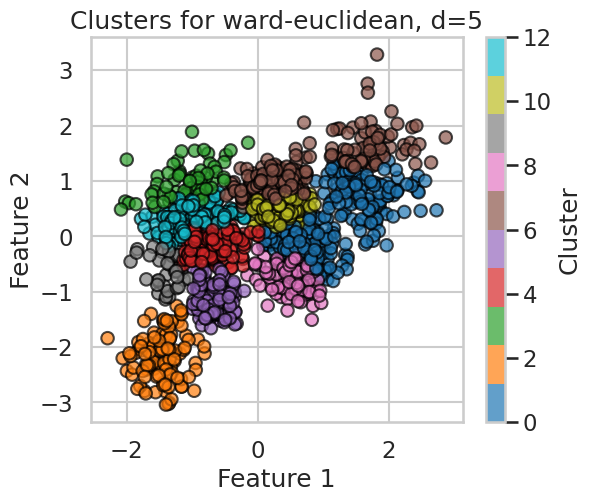

Silhouette Score for affinity=euclidean, linkage=ward, distance_threshold=10: 0.4548664117944667


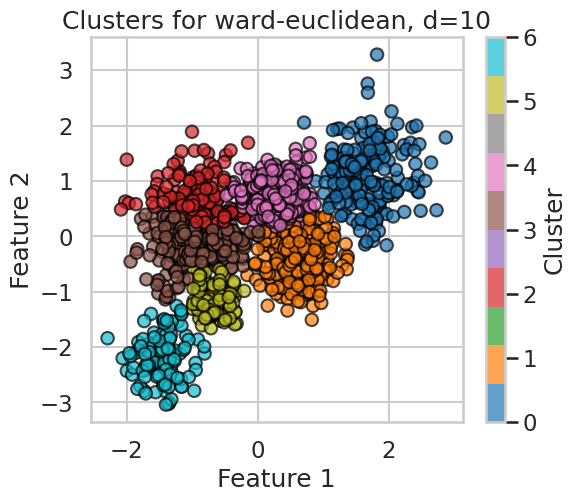

Silhouette Score for affinity=manhattan, linkage=average, distance_threshold=2: 0.41206890339331737


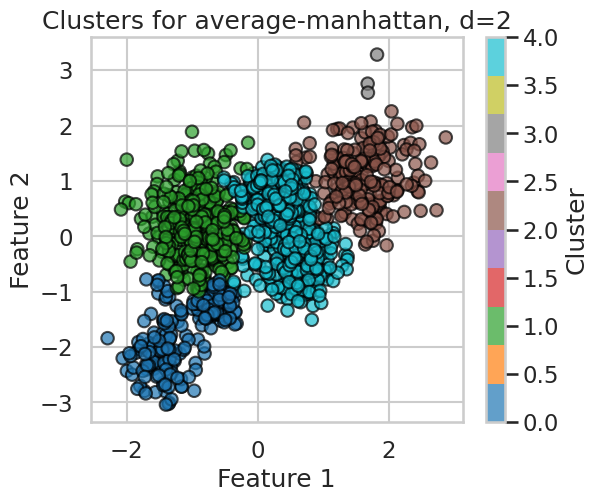

Silhouette Score for affinity=manhattan, linkage=complete, distance_threshold=2: 0.27880184246411144


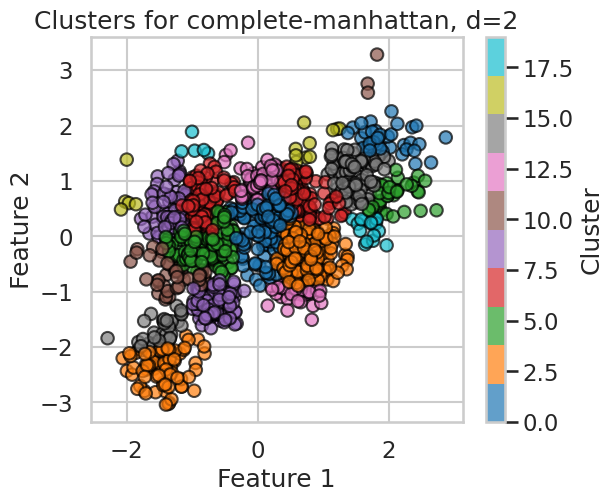

Silhouette Score for affinity=manhattan, linkage=complete, distance_threshold=5: 0.2673867875199795


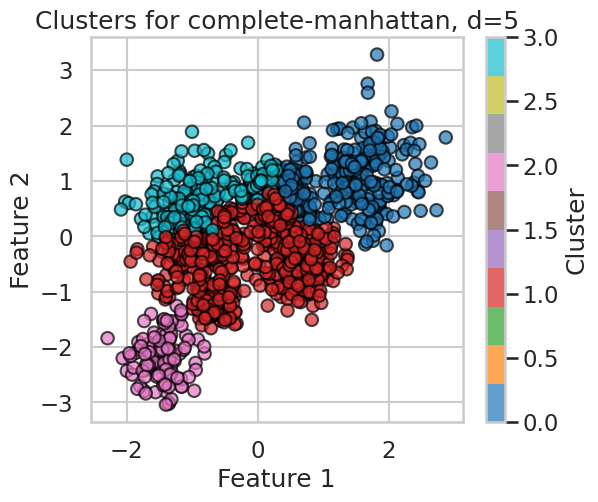


Best Agglomerative Clustering configuration:
{'affinity': 'euclidean', 'linkage': 'ward', 'distance_threshold': 10, 'silhouette_score': np.float64(0.4548664117944667)}


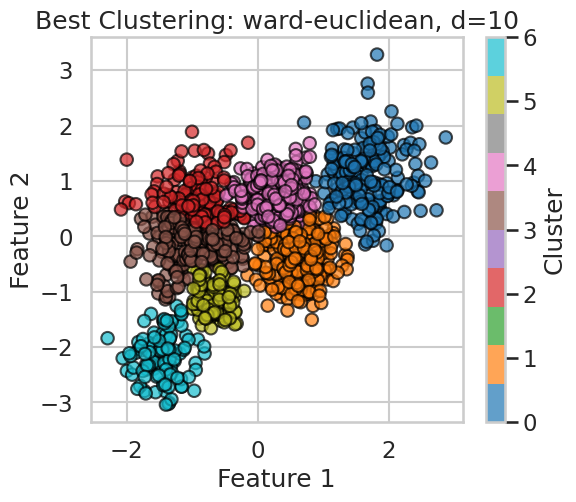

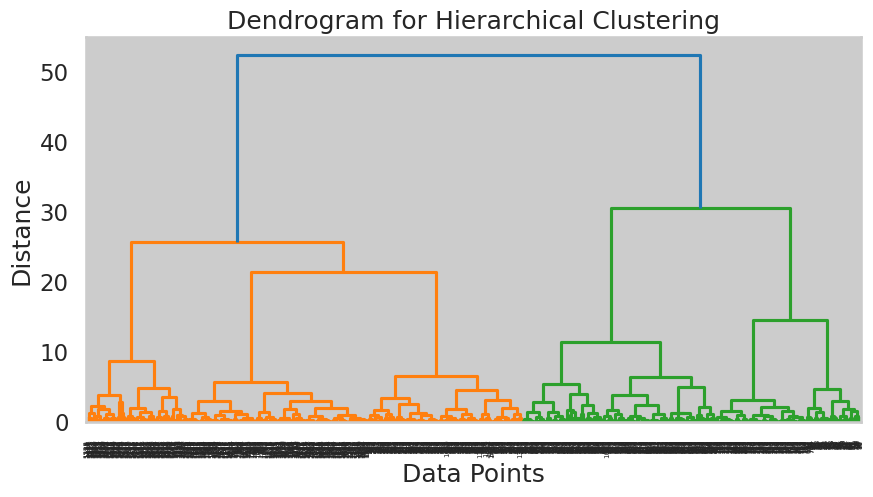

In [12]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.cluster.hierarchy as sch
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler


linkage_list = ["average", "single", "complete", "ward"]
affinity_list = ["euclidean", "manhattan", "cosine"]
distance_thresholds = [2, 5, 10]  # Try different distance thresholds

best_silhouette = -1
best_params = {}

# Loop over different clustering configurations
for affinity in affinity_list:
    for linkage in linkage_list:
        for distance_threshold in distance_thresholds:
            # Skip invalid combinations (ward only works with euclidean)
            if linkage == "ward" and affinity != "euclidean":
                continue

            # Create the model
            model = AgglomerativeClustering(n_clusters=None,
                                            metric=affinity,
                                            linkage=linkage,
                                            distance_threshold=distance_threshold,
                                            compute_full_tree=True)

            labels = model.fit_predict(scaled)

            # Ensure the model created more than 1 cluster before evaluating silhouette score
            if len(set(labels)) > 1:
                silhouette = silhouette_score(scaled, labels)
                print(f"Silhouette Score for affinity={affinity}, linkage={linkage}, distance_threshold={distance_threshold}: {silhouette}")

                # Save best model parameters
                if silhouette > best_silhouette:
                    best_silhouette = silhouette
                    best_params = {
                        "affinity": affinity,
                        "linkage": linkage,
                        "distance_threshold": distance_threshold,
                        "silhouette_score": silhouette
                    }
                    best_labels = labels  # Store labels for the best clustering

                # Plot clustering result for each trial
                plt.figure(figsize=(6, 5))
                plt.scatter(scaled[:, 0], scaled[:, 1], c=labels, cmap='tab10', edgecolors='k', alpha=0.7)
                plt.title(f"Clusters for {linkage}-{affinity}, d={distance_threshold}")
                plt.xlabel("Feature 1")
                plt.ylabel("Feature 2")
                plt.colorbar(label="Cluster")
                plt.show()

# Print the best configuration
print("\nBest Agglomerative Clustering configuration:")
print(best_params)

# Plot the best clustering result
plt.figure(figsize=(6, 5))
plt.scatter(scaled[:, 0], scaled[:, 1], c=best_labels, cmap='tab10', edgecolors='k', alpha=0.7)
plt.title(f"Best Clustering: {best_params['linkage']}-{best_params['affinity']}, d={best_params['distance_threshold']}")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")
plt.colorbar(label="Cluster")
plt.show()

# --- Plot a Dendrogram for a single trial ---
plt.figure(figsize=(10, 5))
linked = sch.linkage(scaled, method="ward")  # Use "ward" for a clear dendrogram
sch.dendrogram(linked)
plt.title("Dendrogram for Hierarchical Clustering")
plt.xlabel("Data Points")
plt.ylabel("Distance")
plt.show()

Agglomerative Clustering Trials:
Silhouette Score for metric=euclidean, linkage=average, distance_threshold=1.4: 0.4101, n_clusters=6


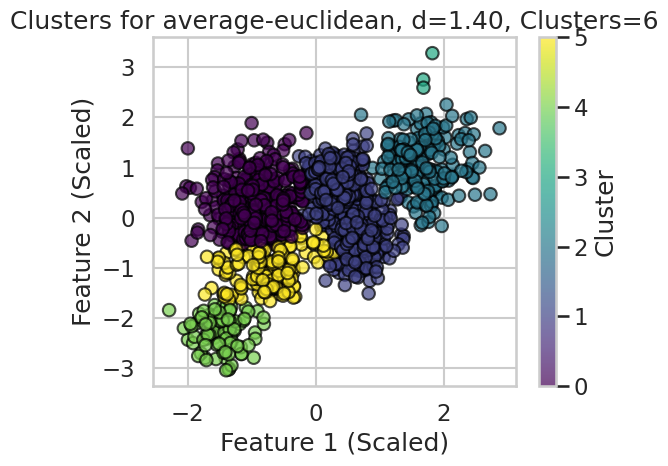

Silhouette Score for metric=euclidean, linkage=average, distance_threshold=1.5: 0.4191, n_clusters=5


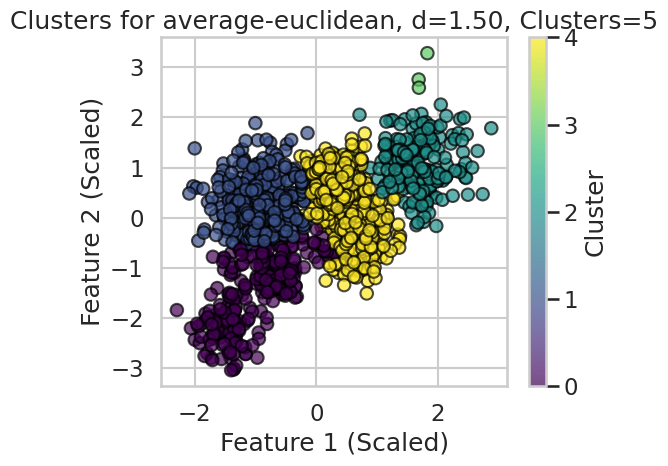

Silhouette Score for metric=euclidean, linkage=average, distance_threshold=1.6: 0.4191, n_clusters=5


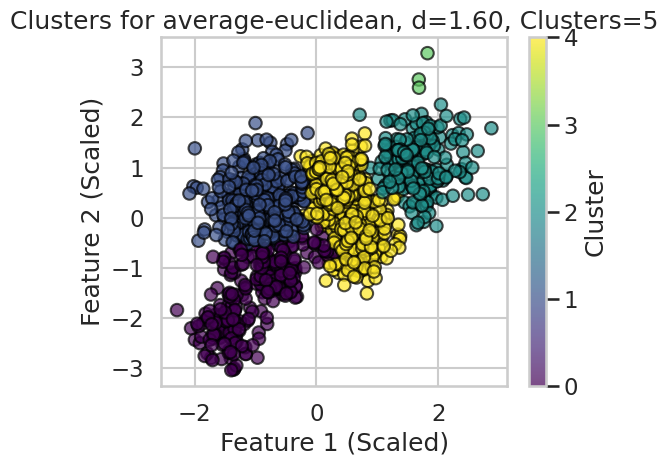

Silhouette Score for metric=euclidean, linkage=average, distance_threshold=1.65: 0.3447, n_clusters=4


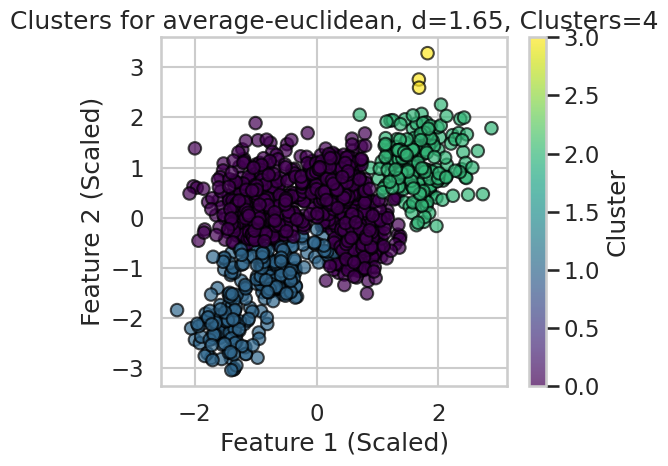

Silhouette Score for metric=euclidean, linkage=average, distance_threshold=2.0: 0.3622, n_clusters=3


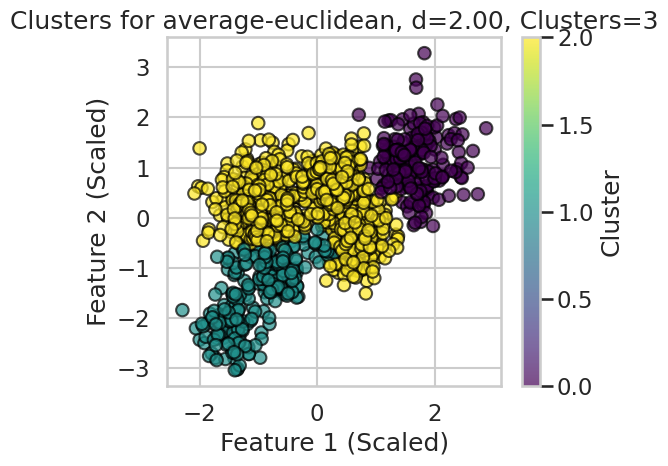

Silhouette Score not calculated for metric=euclidean, linkage=average, distance_threshold=10 (n_clusters=1)
Silhouette Score not calculated for metric=euclidean, linkage=average, distance_threshold=20 (n_clusters=1)
Silhouette Score for metric=cosine, linkage=average, distance_threshold=1.4: 0.4236, n_clusters=2


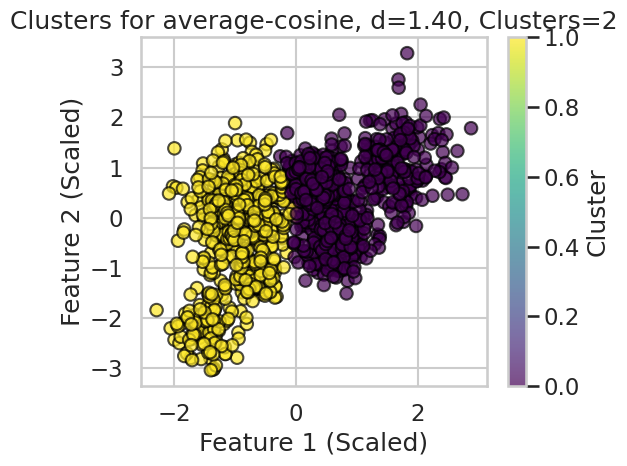

Silhouette Score for metric=cosine, linkage=average, distance_threshold=1.5: 0.4236, n_clusters=2


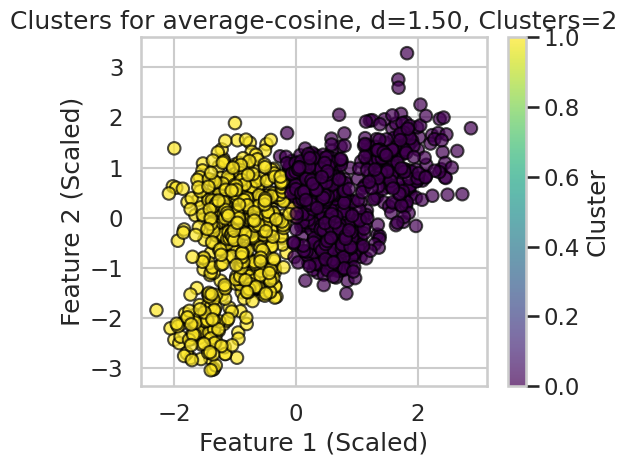

Silhouette Score not calculated for metric=cosine, linkage=average, distance_threshold=1.6 (n_clusters=1)
Silhouette Score not calculated for metric=cosine, linkage=average, distance_threshold=1.65 (n_clusters=1)
Silhouette Score not calculated for metric=cosine, linkage=average, distance_threshold=2.0 (n_clusters=1)
Silhouette Score not calculated for metric=cosine, linkage=average, distance_threshold=10 (n_clusters=1)
Silhouette Score not calculated for metric=cosine, linkage=average, distance_threshold=20 (n_clusters=1)
Silhouette Score for metric=manhattan, linkage=average, distance_threshold=1.4: 0.4101, n_clusters=8


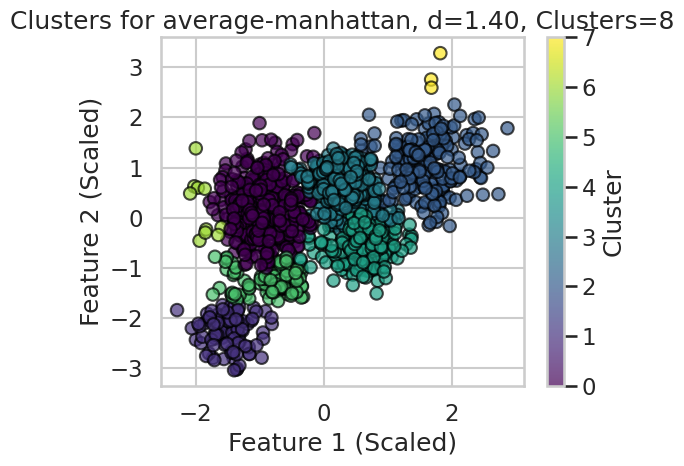

Silhouette Score for metric=manhattan, linkage=average, distance_threshold=1.5: 0.4101, n_clusters=8


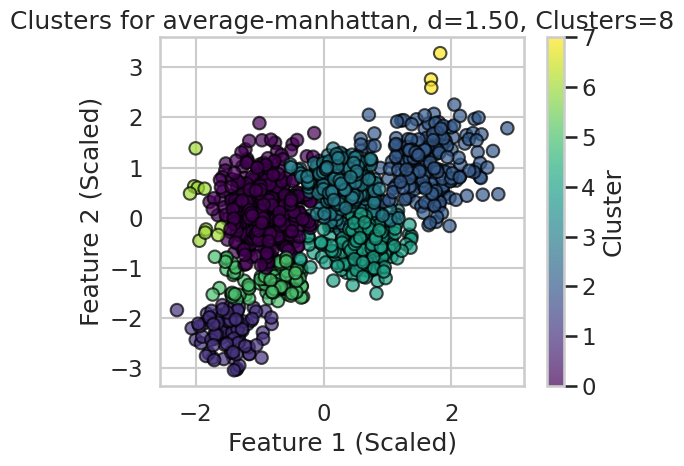

Silhouette Score for metric=manhattan, linkage=average, distance_threshold=1.6: 0.3592, n_clusters=7


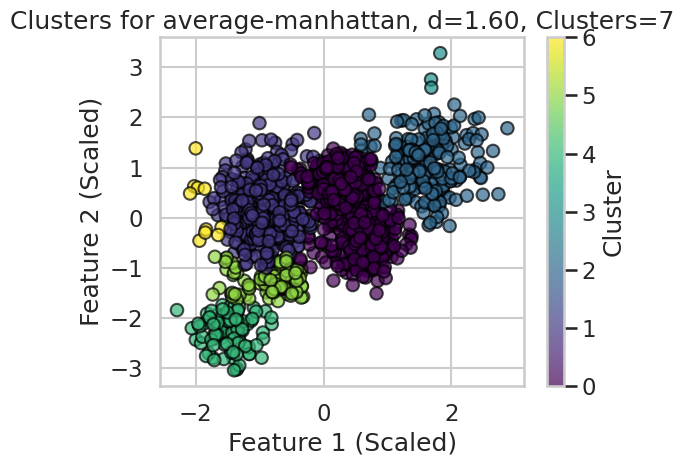

Silhouette Score for metric=manhattan, linkage=average, distance_threshold=1.65: 0.3930, n_clusters=6


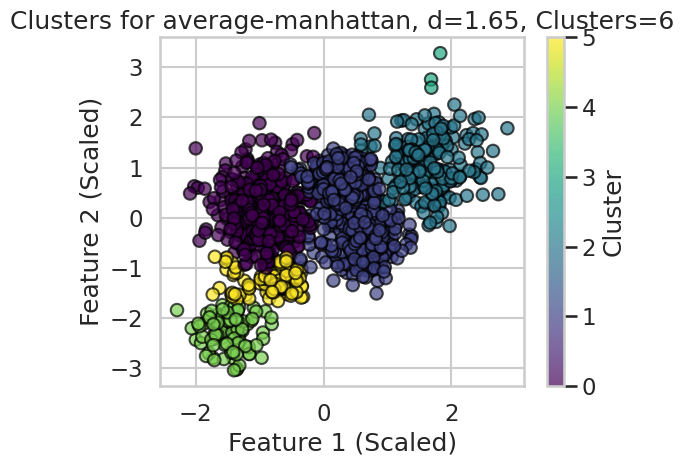

Silhouette Score for metric=manhattan, linkage=average, distance_threshold=2.0: 0.4121, n_clusters=5


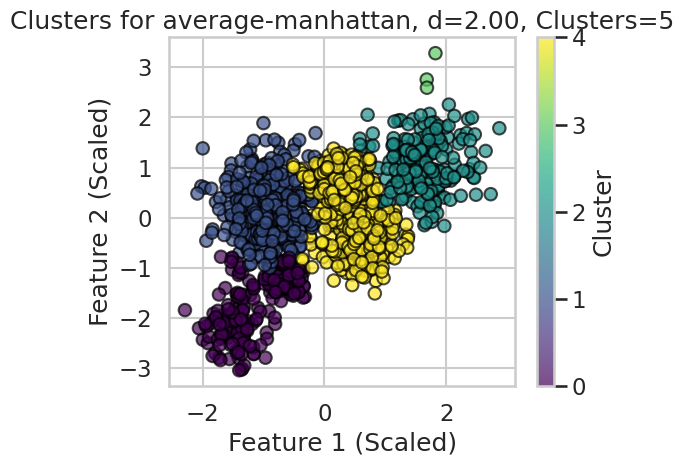

Silhouette Score not calculated for metric=manhattan, linkage=average, distance_threshold=10 (n_clusters=1)
Silhouette Score not calculated for metric=manhattan, linkage=average, distance_threshold=20 (n_clusters=1)
Silhouette Score not calculated for metric=euclidean, linkage=single, distance_threshold=1.4 (n_clusters=1)
Silhouette Score not calculated for metric=euclidean, linkage=single, distance_threshold=1.5 (n_clusters=1)
Silhouette Score not calculated for metric=euclidean, linkage=single, distance_threshold=1.6 (n_clusters=1)
Silhouette Score not calculated for metric=euclidean, linkage=single, distance_threshold=1.65 (n_clusters=1)
Silhouette Score not calculated for metric=euclidean, linkage=single, distance_threshold=2.0 (n_clusters=1)
Silhouette Score not calculated for metric=euclidean, linkage=single, distance_threshold=10 (n_clusters=1)
Silhouette Score not calculated for metric=euclidean, linkage=single, distance_threshold=20 (n_clusters=1)
Silhouette Score not calculat

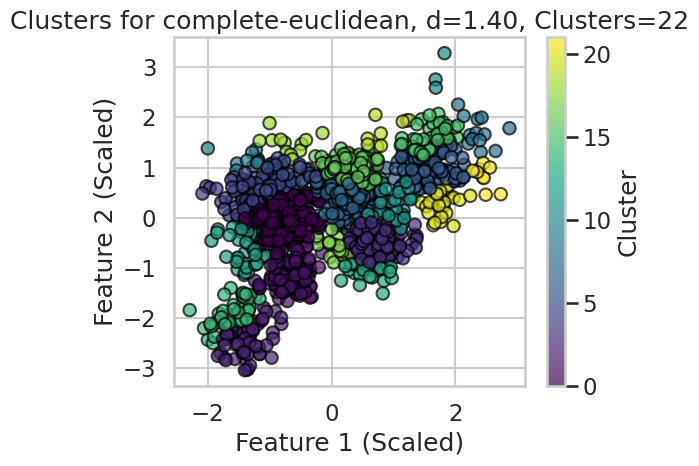

Silhouette Score for metric=euclidean, linkage=complete, distance_threshold=1.5: 0.3090, n_clusters=20


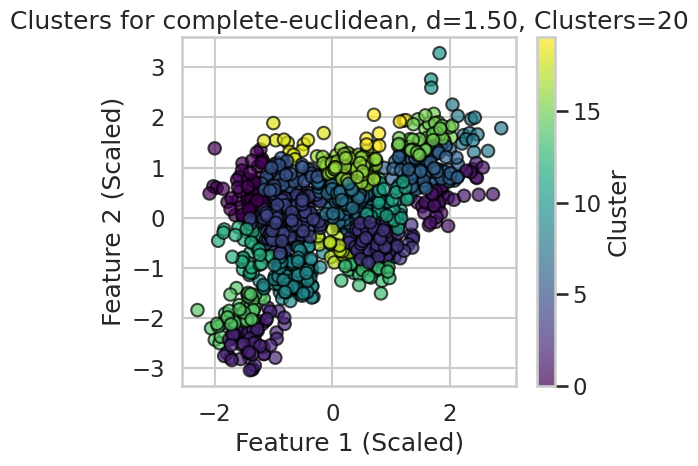

Silhouette Score for metric=euclidean, linkage=complete, distance_threshold=1.6: 0.3280, n_clusters=17


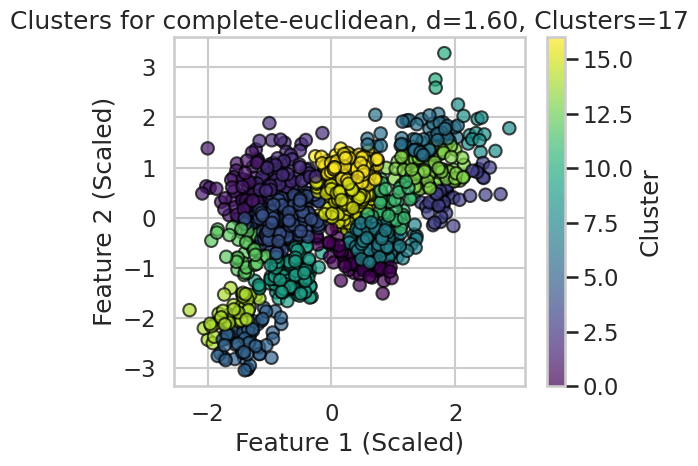

Silhouette Score for metric=euclidean, linkage=complete, distance_threshold=1.65: 0.3499, n_clusters=15


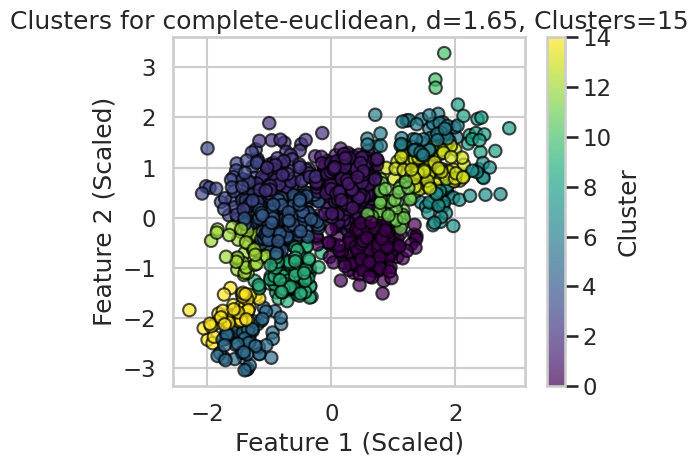

Silhouette Score for metric=euclidean, linkage=complete, distance_threshold=2.0: 0.3949, n_clusters=11


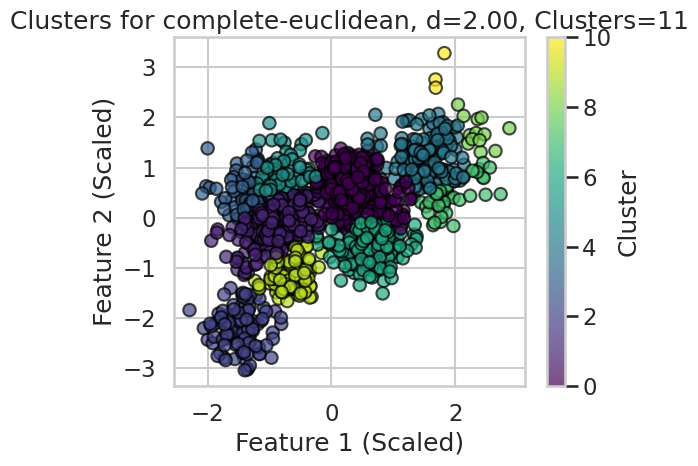

Silhouette Score not calculated for metric=euclidean, linkage=complete, distance_threshold=10 (n_clusters=1)
Silhouette Score not calculated for metric=euclidean, linkage=complete, distance_threshold=20 (n_clusters=1)
Silhouette Score for metric=cosine, linkage=complete, distance_threshold=1.4: 0.2489, n_clusters=5


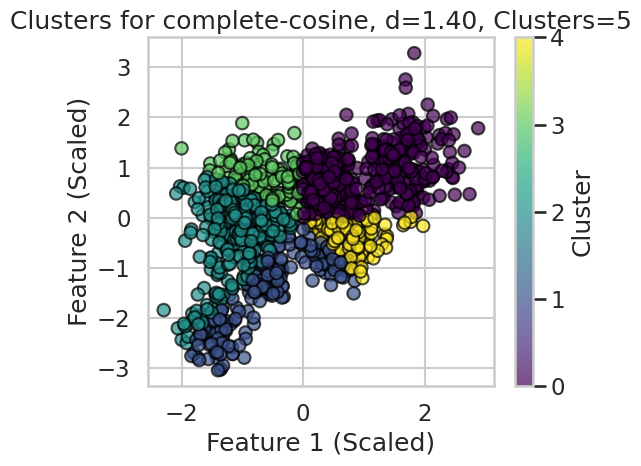

Silhouette Score for metric=cosine, linkage=complete, distance_threshold=1.5: 0.2489, n_clusters=5


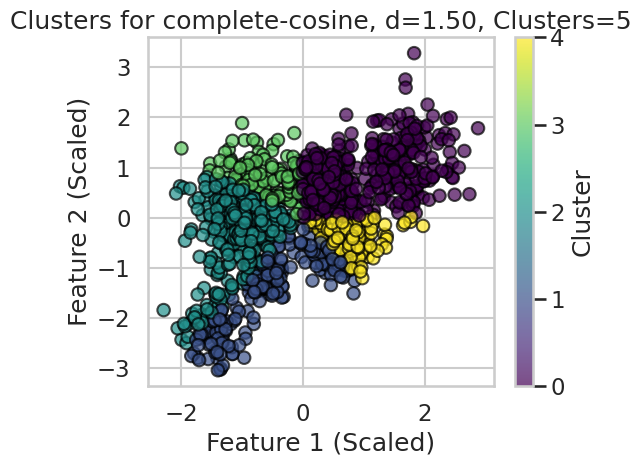

Silhouette Score for metric=cosine, linkage=complete, distance_threshold=1.6: 0.2489, n_clusters=5


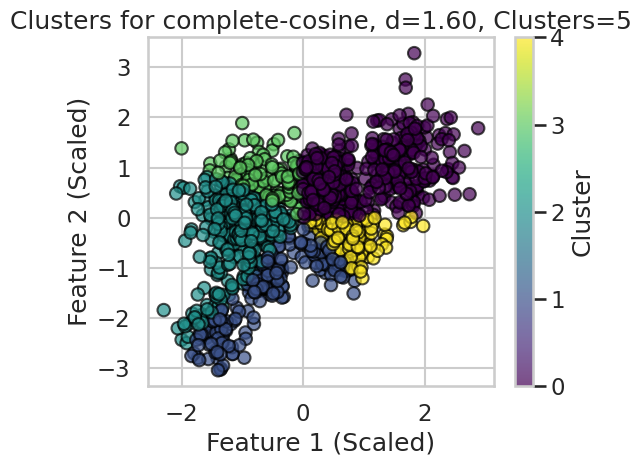

Silhouette Score for metric=cosine, linkage=complete, distance_threshold=1.65: 0.2419, n_clusters=4


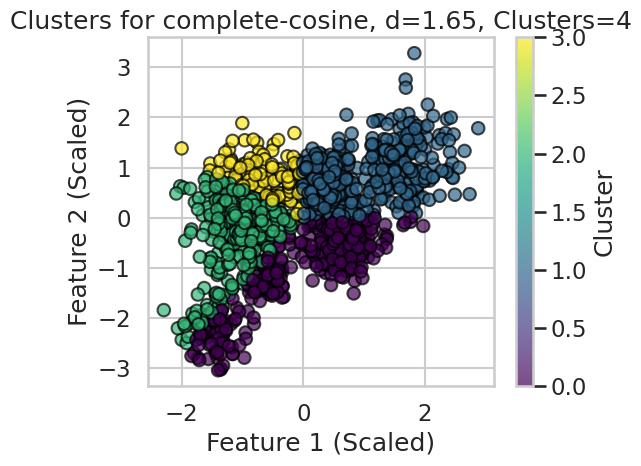

Silhouette Score not calculated for metric=cosine, linkage=complete, distance_threshold=2.0 (n_clusters=1)
Silhouette Score not calculated for metric=cosine, linkage=complete, distance_threshold=10 (n_clusters=1)
Silhouette Score not calculated for metric=cosine, linkage=complete, distance_threshold=20 (n_clusters=1)
Silhouette Score for metric=manhattan, linkage=complete, distance_threshold=1.4: 0.2984, n_clusters=36


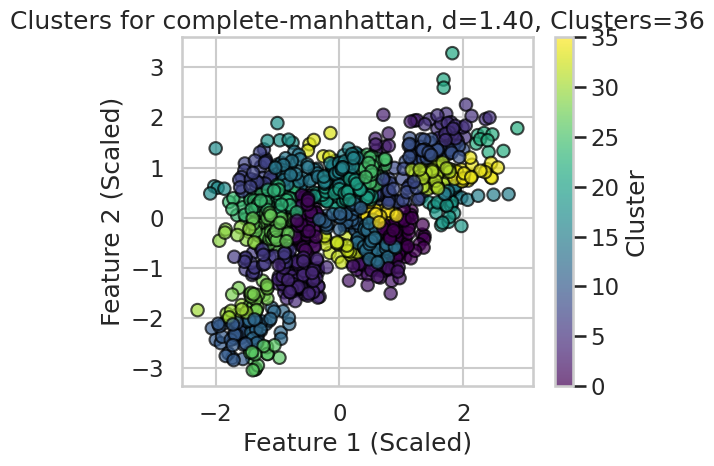

Silhouette Score for metric=manhattan, linkage=complete, distance_threshold=1.5: 0.2720, n_clusters=30


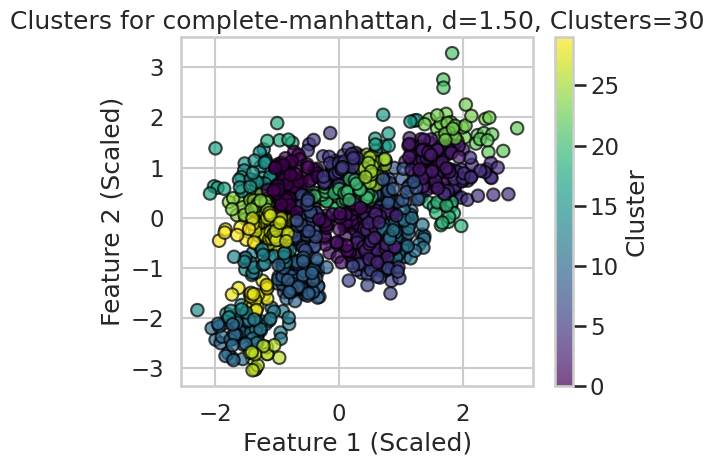

Silhouette Score for metric=manhattan, linkage=complete, distance_threshold=1.6: 0.2720, n_clusters=30


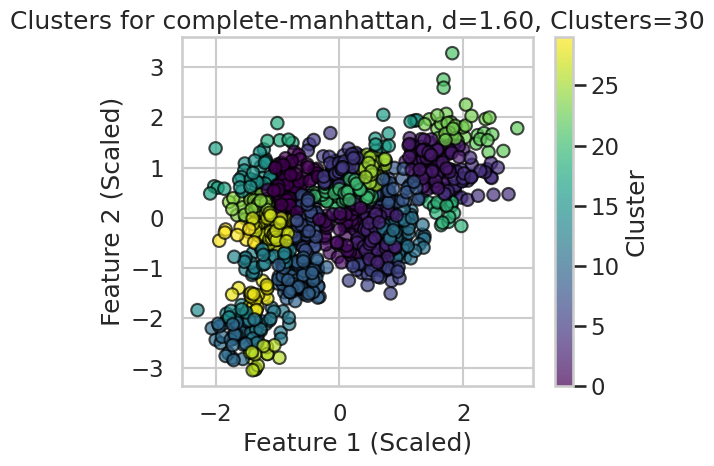

Silhouette Score for metric=manhattan, linkage=complete, distance_threshold=1.65: 0.2790, n_clusters=28


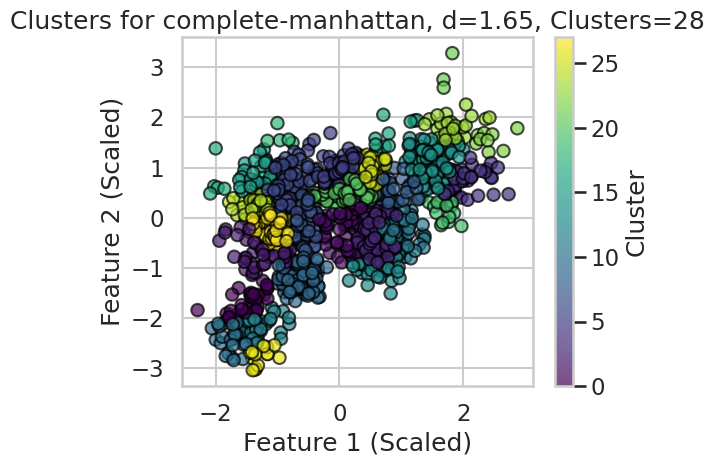

Silhouette Score for metric=manhattan, linkage=complete, distance_threshold=2.0: 0.2788, n_clusters=20


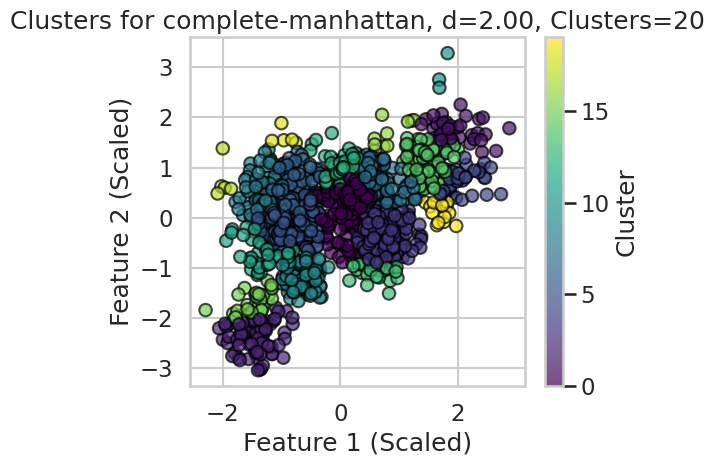

Silhouette Score not calculated for metric=manhattan, linkage=complete, distance_threshold=10 (n_clusters=1)
Silhouette Score not calculated for metric=manhattan, linkage=complete, distance_threshold=20 (n_clusters=1)
Silhouette Score for metric=euclidean, linkage=ward, distance_threshold=1.4: 0.3125, n_clusters=56


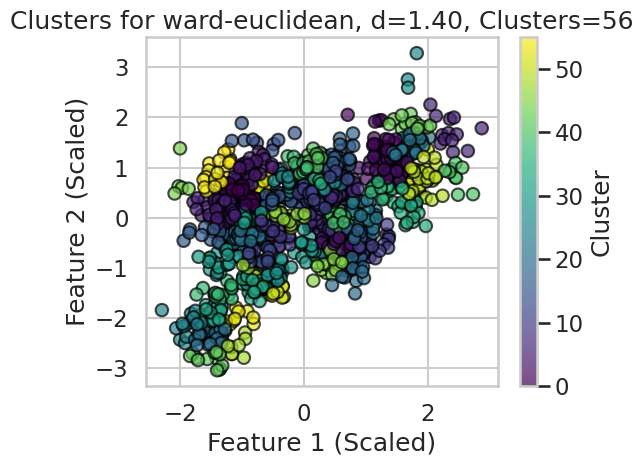

Silhouette Score for metric=euclidean, linkage=ward, distance_threshold=1.5: 0.3082, n_clusters=53


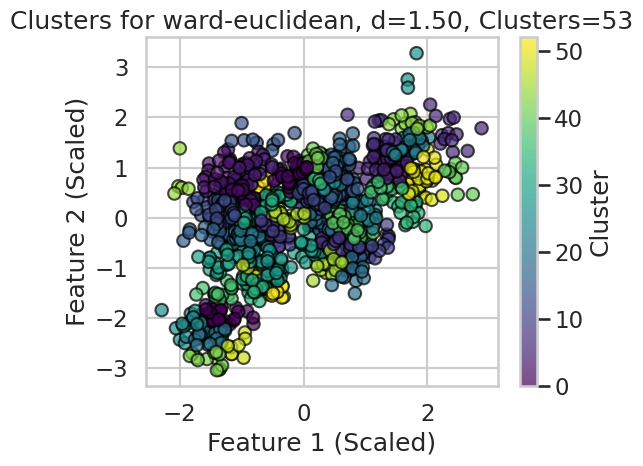

Silhouette Score for metric=euclidean, linkage=ward, distance_threshold=1.6: 0.3027, n_clusters=48


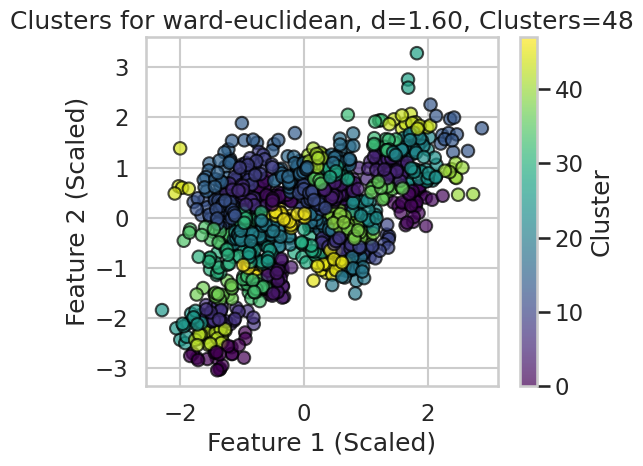

Silhouette Score for metric=euclidean, linkage=ward, distance_threshold=1.65: 0.3034, n_clusters=47


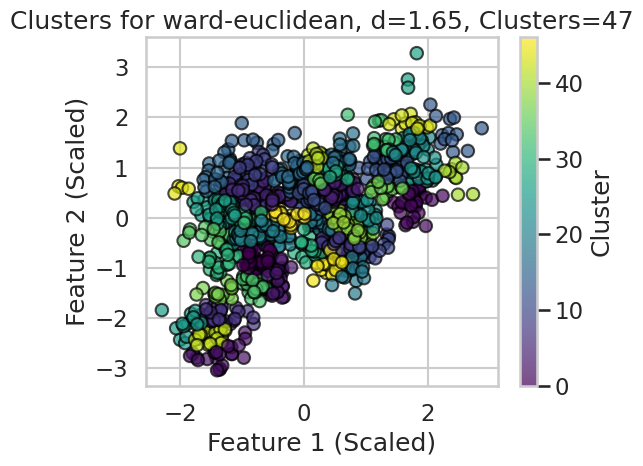

Silhouette Score for metric=euclidean, linkage=ward, distance_threshold=2.0: 0.2932, n_clusters=37


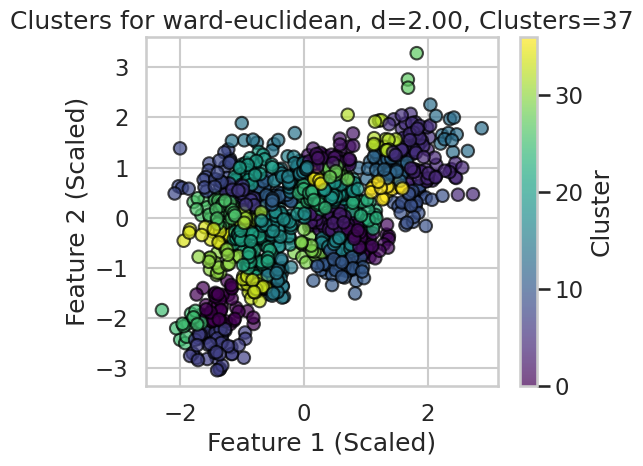

Silhouette Score for metric=euclidean, linkage=ward, distance_threshold=10: 0.4549, n_clusters=7


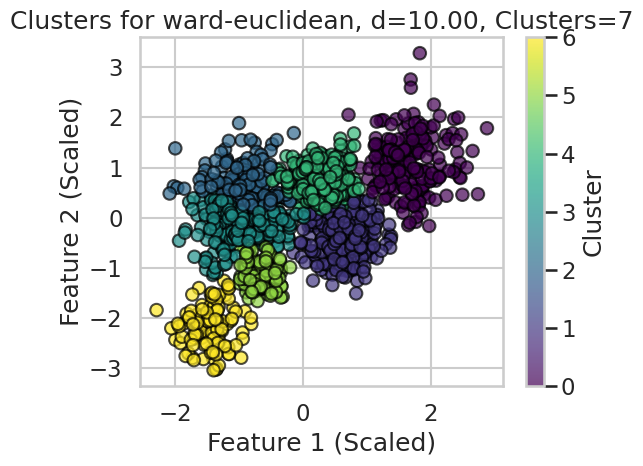

Silhouette Score for metric=euclidean, linkage=ward, distance_threshold=20: 0.4694, n_clusters=5


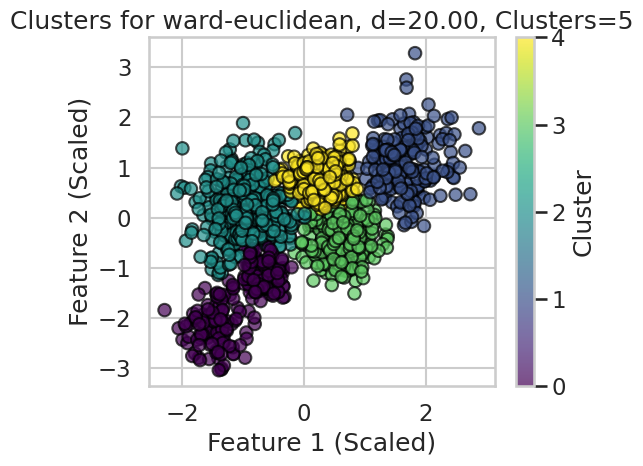


Best Agglomerative Clustering configuration:
{'linkage': 'ward', 'metric': 'euclidean', 'distance_threshold': 20, 'n_clusters': 5, 'silhouette_score': np.float64(0.46941860470586316)}


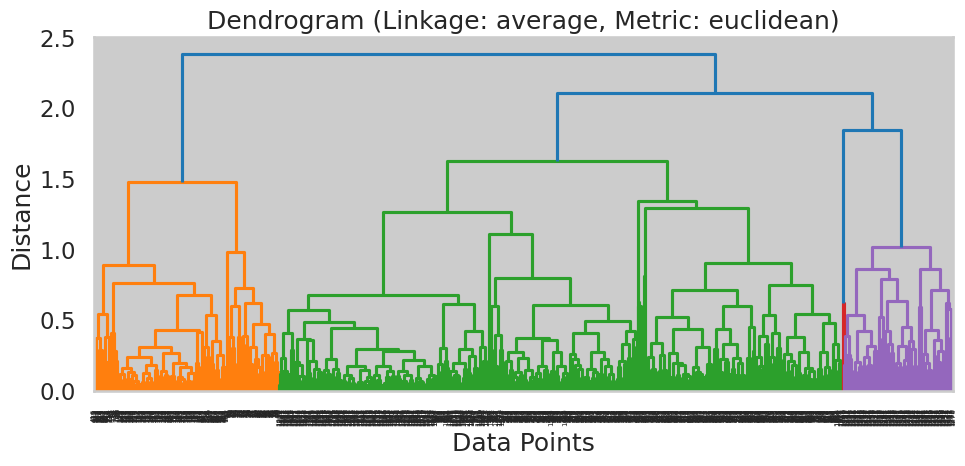

In [13]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.cluster.hierarchy as sch
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler
from sklearn.datasets import make_blobs



# 2. Define Parameter Lists
linkage_types = ["average", "single", "complete", "ward"]
metric_types = ["euclidean", "cosine", "manhattan"]
distance_thresholds_to_try = [1.4, 1.5, 1.6, 1.65, 2.0, 10, 20]

# 3. Initialize Variables to Track Best Performance
highest_silhouette_score = -1
optimal_parameters = {}

# 4. Iterate Through Parameter Combinations
print("Agglomerative Clustering Trials:")
for linkage in linkage_types:
    for metric in metric_types:
        # 'ward' linkage requires 'euclidean' metric
        if linkage == 'ward' and metric != 'euclidean':
            continue

        for threshold in distance_thresholds_to_try:
            # 5. Apply Agglomerative Clustering
            agg_model = AgglomerativeClustering(
                n_clusters=None,
                distance_threshold=threshold,
                linkage=linkage,
                metric=metric  # Use 'metric' instead of 'affinity' when distance_threshold is set
            )

            # 6. Fit and Predict
            cluster_labels = agg_model.fit_predict(scaled)
            num_clusters = len(np.unique(cluster_labels))

            # 7. Evaluate using Silhouette Score
            if num_clusters > 1 and num_clusters < len(scaled):
                silhouette_avg = silhouette_score(scaled, cluster_labels)
                print(f"Silhouette Score for metric={metric}, linkage={linkage}, distance_threshold={threshold}: {silhouette_avg:.4f}, n_clusters={num_clusters}")

                # 8. Update Best Score and Parameters
                if silhouette_avg > highest_silhouette_score:
                    highest_silhouette_score = silhouette_avg
                    optimal_parameters = {
                        'linkage': linkage,
                        'metric': metric,
                        'distance_threshold': threshold,
                        'n_clusters': num_clusters,
                        'silhouette_score': highest_silhouette_score
                    }

                # 9. Plot Clustered Data for Each Trial
                plt.figure(figsize=(6, 5))
                plt.scatter(scaled[:, 0], scaled[:, 1], c=cluster_labels, cmap='viridis', edgecolors='k', alpha=0.7)
                plt.title(f"Clusters for {linkage}-{metric}, d={threshold:.2f}, Clusters={num_clusters}")
                plt.xlabel("Feature 1 (Scaled)")
                plt.ylabel("Feature 2 (Scaled)")
                plt.colorbar(label="Cluster")
                plt.tight_layout()
                plt.show()
            else:
                print(f"Silhouette Score not calculated for metric={metric}, linkage={linkage}, distance_threshold={threshold} (n_clusters={num_clusters})")

# 10. Display Best Configuration
print("\nBest Agglomerative Clustering configuration:")
print(optimal_parameters)

# 11. Plot Dendrogram for One Trial (e.g., the first valid combination)
plt.figure(figsize=(10, 5))
linked_matrix = sch.linkage(scaled, method=linkage_types[0], metric=metric_types[0])
sch.dendrogram(linked_matrix, orientation='top')
plt.title(f"Dendrogram (Linkage: {linkage_types[0]}, Metric: {metric_types[0]})")
plt.xlabel("Data Points")
plt.ylabel("Distance")
plt.tight_layout()
plt.show()

### DBScan
* Use DBScan function to  to cluster the above data.
* In the  DBscan change the following parameters:
    * EPS (from 0.1 to 3)
    * Min_samples (from 5 to 25)
    * Another option: Lookup K-Distance graph method
* Plot the silhouette_score versus the variation in the EPS and the min_samples.
* Plot the resulting Clusters in this case.
* Find the set of paramters that would find result in the best silhouette_score and store this score for later comparison with other clustering techniques.
* Record your observations and comments.

In [14]:
!pip install kneed

DBSCAN Clustering Trials:
  EPS=0.10, Min_samples=5: Silhouette Score=0.8373, Clusters=4
  EPS=0.10, Min_samples=15: Silhouette Score=0.6454, Clusters=4
  EPS=0.10, Min_samples=25: Silhouette Score=0.3086, Clusters=4
  EPS=0.60, Min_samples=5: Silhouette Score=0.8796, Clusters=4
  EPS=0.60, Min_samples=15: Silhouette Score=0.8796, Clusters=4
  EPS=0.60, Min_samples=25: Silhouette Score=0.8796, Clusters=4
  EPS=1.10, Min_samples=5: Silhouette Score=0.7845, Clusters=3
  EPS=1.10, Min_samples=15: Silhouette Score=0.7845, Clusters=3
  EPS=1.10, Min_samples=25: Silhouette Score=0.7845, Clusters=3
  EPS=1.60, Min_samples=5: Silhouette Score=0.5822, Clusters=2
  EPS=1.60, Min_samples=15: Silhouette Score=0.5822, Clusters=2
  EPS=1.60, Min_samples=25: Silhouette Score=0.5822, Clusters=2
  EPS=2.10, Min_samples=5: Less than 2 clusters found.
  EPS=2.10, Min_samples=15: Less than 2 clusters found.
  EPS=2.10, Min_samples=25: Less than 2 clusters found.
  EPS=2.60, Min_samples=5: Less than 2 clus

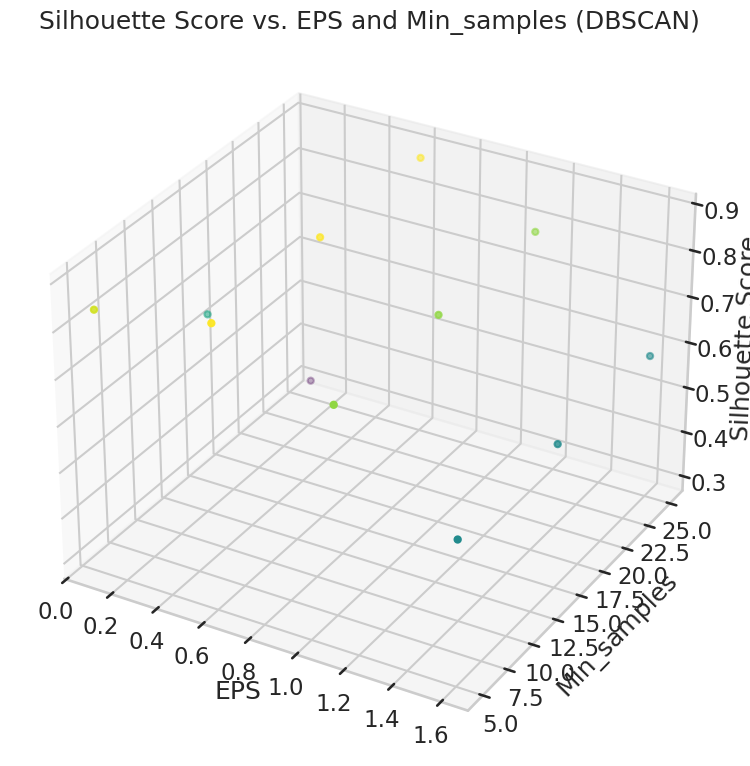


--- Plotting Resulting Clusters ---


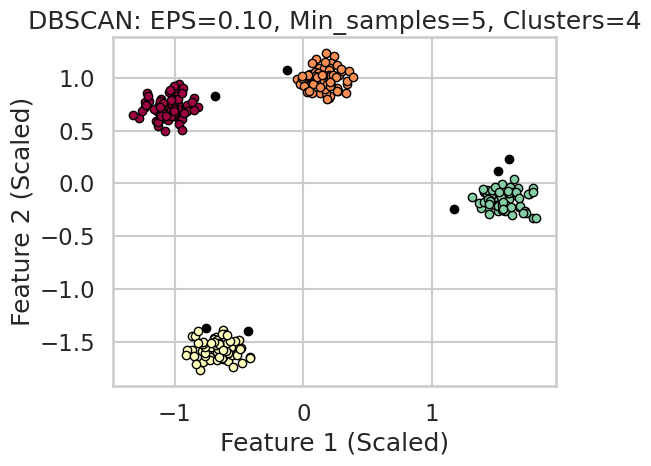

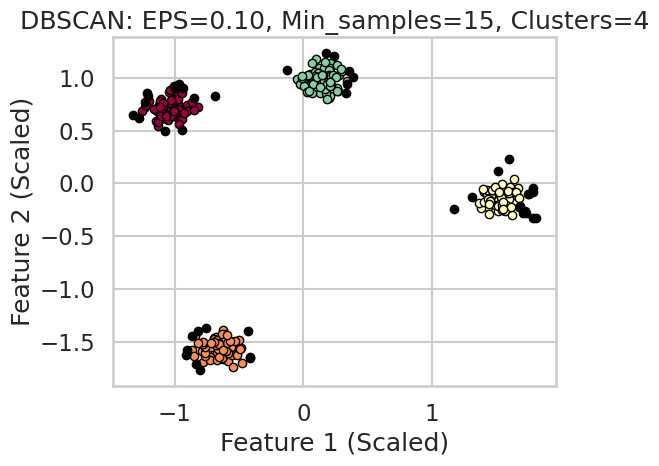

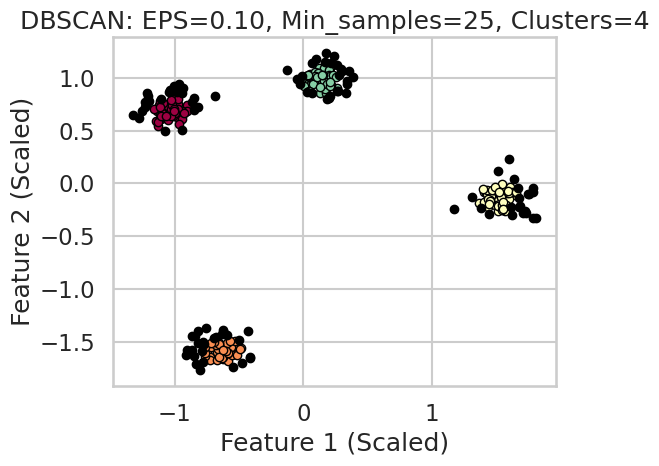

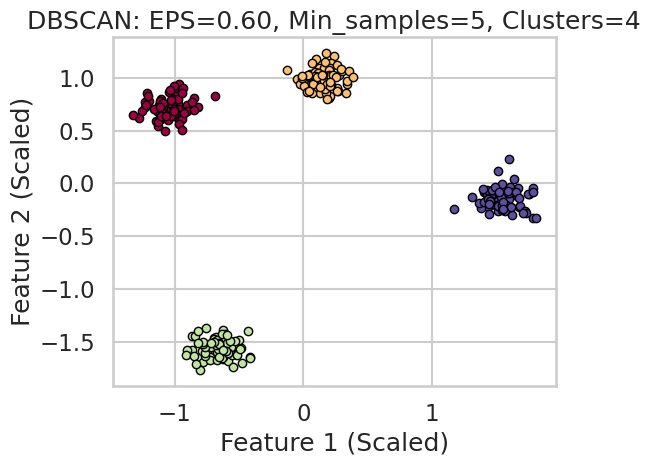

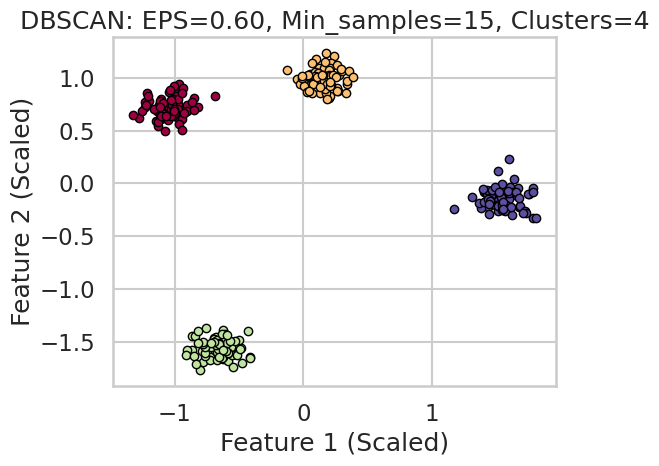

...

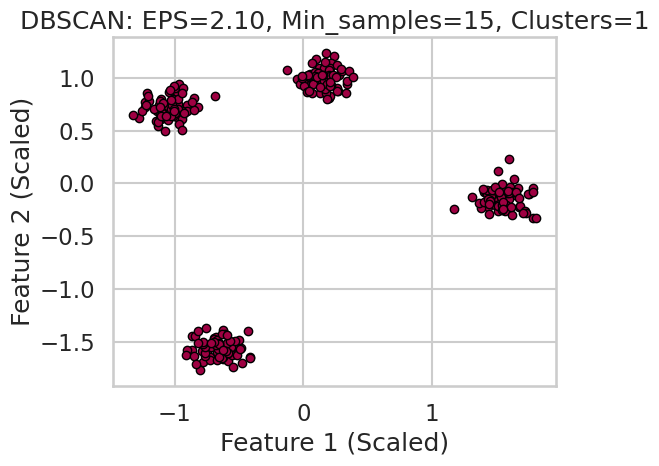

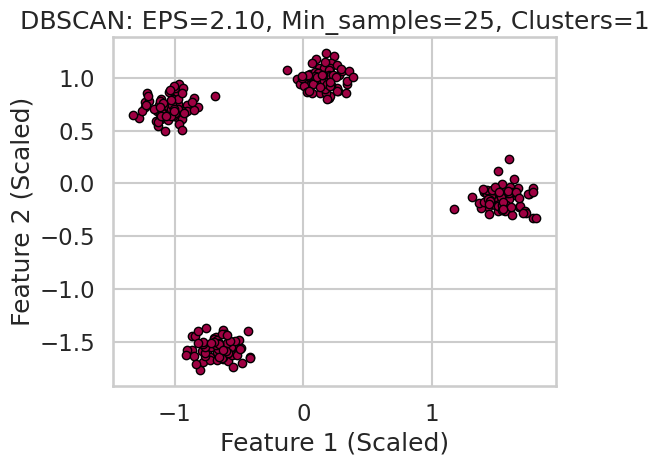

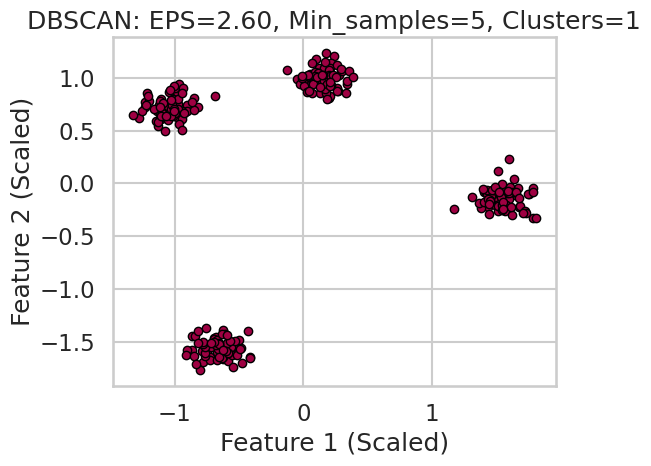

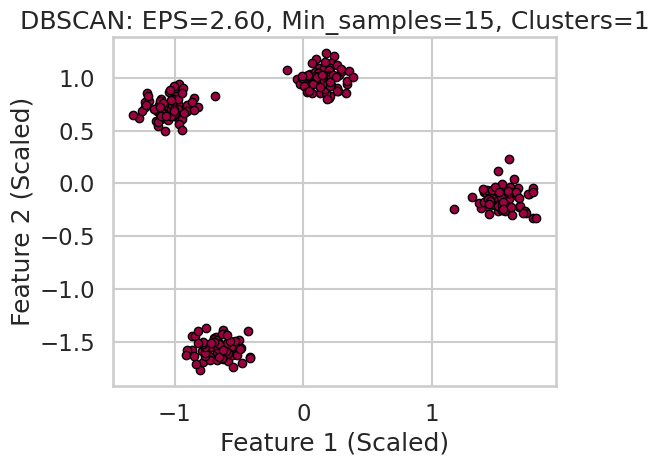

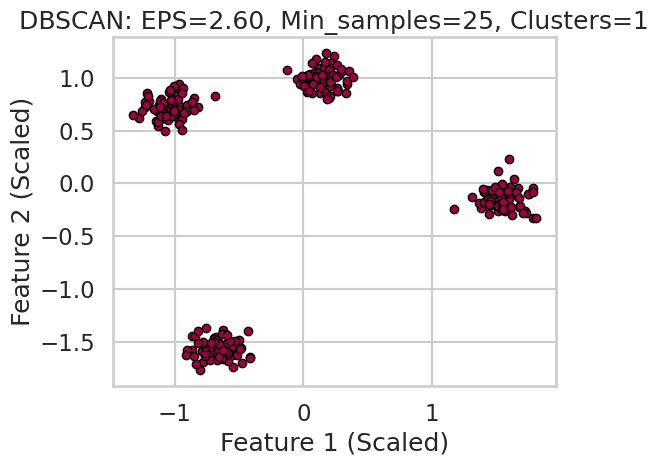


--- Best Parameters ---
Best DBSCAN Clustering configuration:
{'eps': np.float64(0.6), 'min_samples': 5, 'n_clusters': 4, 'silhouette_score': np.float64(0.879591338894901)}
Best Silhouette Score: 0.8796

--- K-Distance Graph Method ---


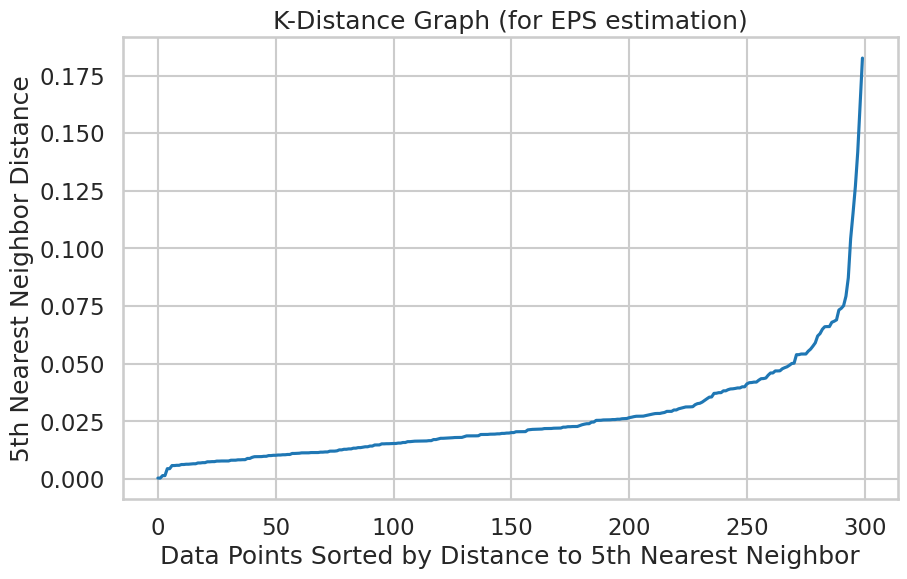

In [15]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler
from sklearn.datasets import make_blobs
from sklearn.neighbors import NearestNeighbors

# 1. Generate Sample Data
X, y = make_blobs(n_samples=300, centers=4, cluster_std=0.60, random_state=42)
scaler = StandardScaler()
scaled_data = scaler.fit_transform(X)

# 2. Define Parameter Ranges
eps_values = np.arange(0.1, 3.1, 0.5)  # Reduced for simplicity
min_samples_values = range(5, 26, 10)  # Reduced for simplicity

# 3. Initialize Variables for Best Performance
highest_silhouette_score_dbscan = -1
optimal_parameters_dbscan = {}
silhouette_scores_dbscan = {}

print("DBSCAN Clustering Trials:")

# 4. Iterate Through Parameter Combinations
for eps in eps_values:
    for min_samples in min_samples_values:
        # 5. Apply DBSCAN Clustering
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        cluster_labels = dbscan.fit_predict(scaled_data)
        num_clusters = len(set(cluster_labels)) - (1 if -1 in cluster_labels else 0)

        # 6. Evaluate using Silhouette Score
        if num_clusters > 1:
            silhouette_avg = silhouette_score(scaled_data, cluster_labels)
            silhouette_scores_dbscan[(eps, min_samples)] = silhouette_avg
            print(f"  EPS={eps:.2f}, Min_samples={min_samples}: Silhouette Score={silhouette_avg:.4f}, Clusters={num_clusters}")

            # 7. Update Best Score and Parameters
            if silhouette_avg > highest_silhouette_score_dbscan:
                highest_silhouette_score_dbscan = silhouette_avg
                optimal_parameters_dbscan = {
                    'eps': eps,
                    'min_samples': min_samples,
                    'n_clusters': num_clusters,
                    'silhouette_score': highest_silhouette_score_dbscan
                }
        else:
            silhouette_scores_dbscan[(eps, min_samples)] = None
            print(f"  EPS={eps:.2f}, Min_samples={min_samples}: Less than 2 clusters found.")

# --- Separate Code for Each Requirement ---

# Requirement: Plot the silhouette_score versus the variation in the EPS and the min_samples.
print("\n--- Plotting Silhouette Score ---")
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

eps_points, min_samples_points, scores = [], [], []
for (eps, ms), score in silhouette_scores_dbscan.items():
    if score is not None:
        eps_points.append(eps)
        min_samples_points.append(ms)
        scores.append(score)

ax.scatter(eps_points, min_samples_points, scores, c=scores, cmap='viridis')
ax.set_xlabel('EPS')
ax.set_ylabel('Min_samples')
ax.set_zlabel('Silhouette Score')
ax.set_title('Silhouette Score vs. EPS and Min_samples (DBSCAN)')
plt.tight_layout()
plt.show()

# Requirement: Plot the resulting Clusters in this case (for all parameter combinations).
print("\n--- Plotting Resulting Clusters ---")
for eps in eps_values:
    for min_samples in min_samples_values:
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        cluster_labels = dbscan.fit_predict(scaled_data)
        num_clusters = len(set(cluster_labels)) - (1 if -1 in cluster_labels else 0)

        plt.figure(figsize=(6, 5))
        unique_labels = set(cluster_labels)
        colors = [plt.cm.Spectral(each) for each in np.linspace(0, 1, len(unique_labels))]
        for k, col in zip(unique_labels, colors):
            if k == -1:
                col = [0, 0, 0, 1]  # Black color for noise
            class_member_mask = (cluster_labels == k)
            xy = scaled_data[class_member_mask]
            plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col),
                     markeredgecolor='k', markersize=6)

        plt.title(f"DBSCAN: EPS={eps:.2f}, Min_samples={min_samples}, Clusters={num_clusters}")
        plt.xlabel("Feature 1 (Scaled)")
        plt.ylabel("Feature 2 (Scaled)")
        plt.tight_layout()
        plt.show()

# Requirement: Find the set of parameters that would find result in the best silhouette_score.
print("\n--- Best Parameters ---")
print("Best DBSCAN Clustering configuration:")
print(optimal_parameters_dbscan)
print(f"Best Silhouette Score: {highest_silhouette_score_dbscan:.4f}")

# Requirement: Lookup K-Distance graph method
print("\n--- K-Distance Graph Method ---")
neighbors = NearestNeighbors(n_neighbors=5)  # Consider k=min_samples (example)
neighbors_fit = neighbors.fit(scaled_data)
distances, indices = neighbors_fit.kneighbors(scaled_data)
distances = np.sort(distances, axis=0)
distances = distances[:, 1]
plt.figure(figsize=(10, 6))
plt.plot(distances)
plt.xlabel('Data Points Sorted by Distance to 5th Nearest Neighbor')
plt.ylabel('5th Nearest Neighbor Distance')
plt.title('K-Distance Graph (for EPS estimation)')
plt.grid(True)
plt.show()



In [ ]:
#--- Observations and Comments on DBSCAN ---
#1. DBSCAN effectively identifies clusters based on density, without needing to specify the number of clusters beforehand.
#2. The 'eps' parameter significantly influences the clustering. A small 'eps' can lead to many small clusters and noise, while a large 'eps' might merge distinct clusters.
#3. 'min_samples' controls the density required for a point to be a core point. Higher values make the clustering more robust to noise.
#4. The silhouette score can be used for evaluation, but its interpretability might be limited with DBSCAN due to its ability to find non-globular clusters and identify noise.
#5. The 3D scatter plot helps visualize the relationship between EPS, min_samples, and the resulting silhouette score.
#6. The K-Distance graph is a useful tool for estimating a suitable 'eps' value by looking for the 'elbow' in the distance to the k-th nearest neighbor.
#7. The optimal DBSCAN parameters are highly dataset-dependent and often require experimentation.

## iris data set
The iris data set is test data set that is part of the Sklearn module
which contains 150 records each with 4 features. All the features are represented by real numbers.

The data represents three classes.


In [16]:
from sklearn.datasets import load_iris
iris_data = load_iris()
iris_data.target[[10, 25, 50]]
#array([0, 0, 1])
list(iris_data.target_names)
['setosa', 'versicolor', 'virginica']


['setosa', 'versicolor', 'virginica']

In [17]:
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.datasets import load_iris
import pandas as pd

# Load the Iris dataset
iris = load_iris()
df = pd.DataFrame(data=iris.data, columns=iris.feature_names)
df['target'] = pd.Series(iris.target)
df['target_names'] = df['target'].apply(lambda x: iris.target_names[x])
df.head()



,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm),target,target_names
0,5.1,3.5,1.4,0.2,0,setosa
1,4.9,3.0,1.4,0.2,0,setosa
2,4.7,3.2,1.3,0.2,0,setosa
3,4.6,3.1,1.5,0.2,0,setosa
4,5.0,3.6,1.4,0.2,0,setosa


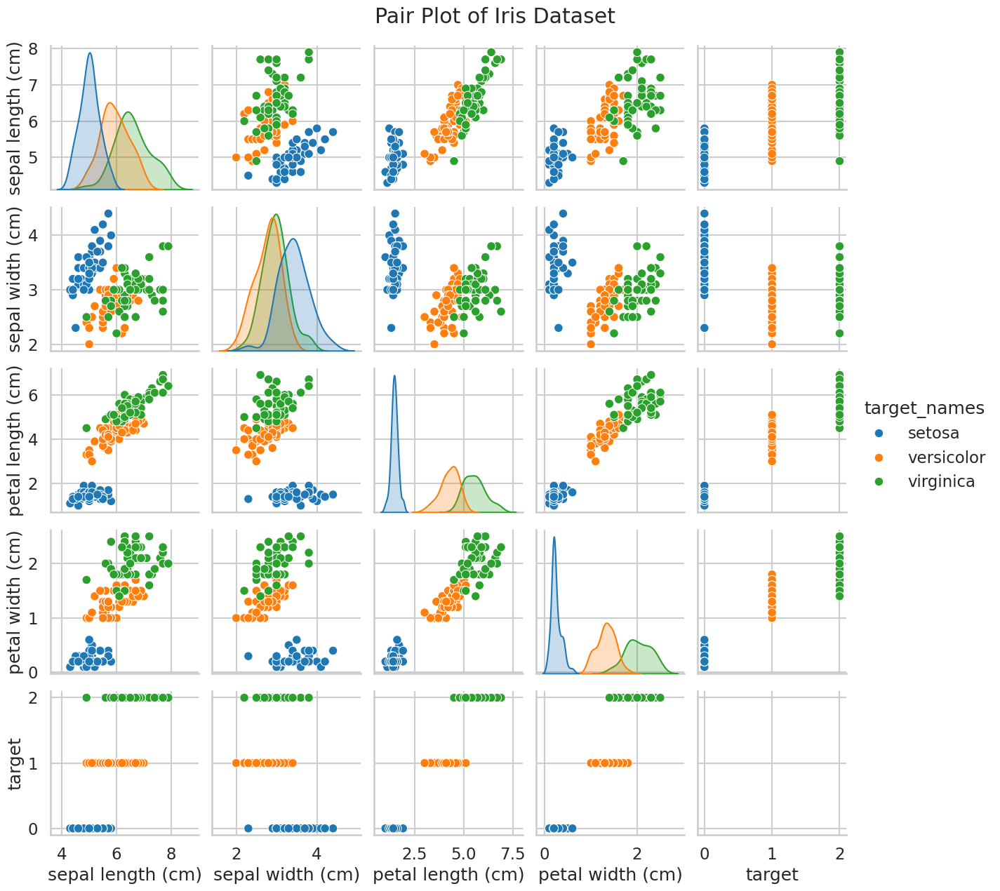

In [18]:
# Create the pair plot
sns.pairplot(df, hue='target_names')
plt.suptitle("Pair Plot of Iris Dataset", y=1.02)
plt.show()

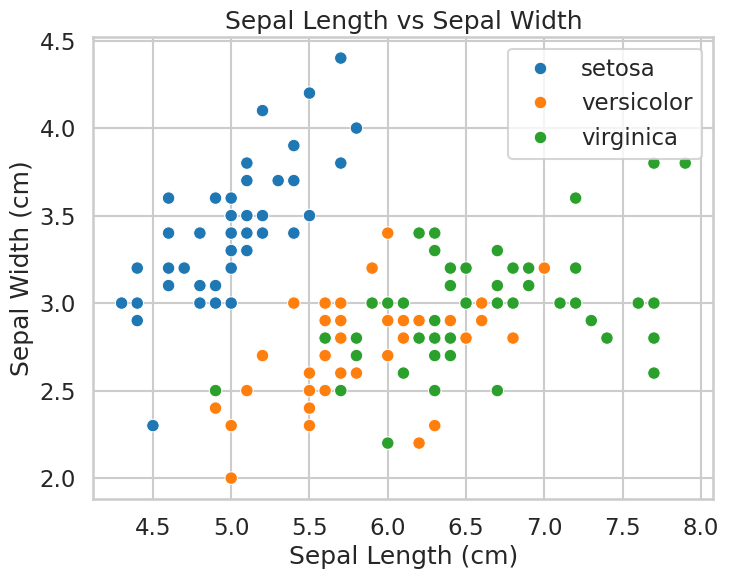

In [19]:
import matplotlib.pyplot as plt
from sklearn.datasets import load_iris
import pandas as pd

# Load the Iris dataset
iris = load_iris()
df = pd.DataFrame(data=iris.data, columns=iris.feature_names)
df['target'] = pd.Series(iris.target)
df['target_names'] = df['target'].apply(lambda x: iris.target_names[x])

# Scatter plot of Sepal Length vs Sepal Width
plt.figure(figsize=(8, 6))
sns.scatterplot(x='sepal length (cm)', y='sepal width (cm)', hue='target_names', data=df)
plt.title('Sepal Length vs Sepal Width')
plt.xlabel('Sepal Length (cm)')
plt.ylabel('Sepal Width (cm)')
plt.legend()
plt.show()

# You can create similar plots for other feature pairs

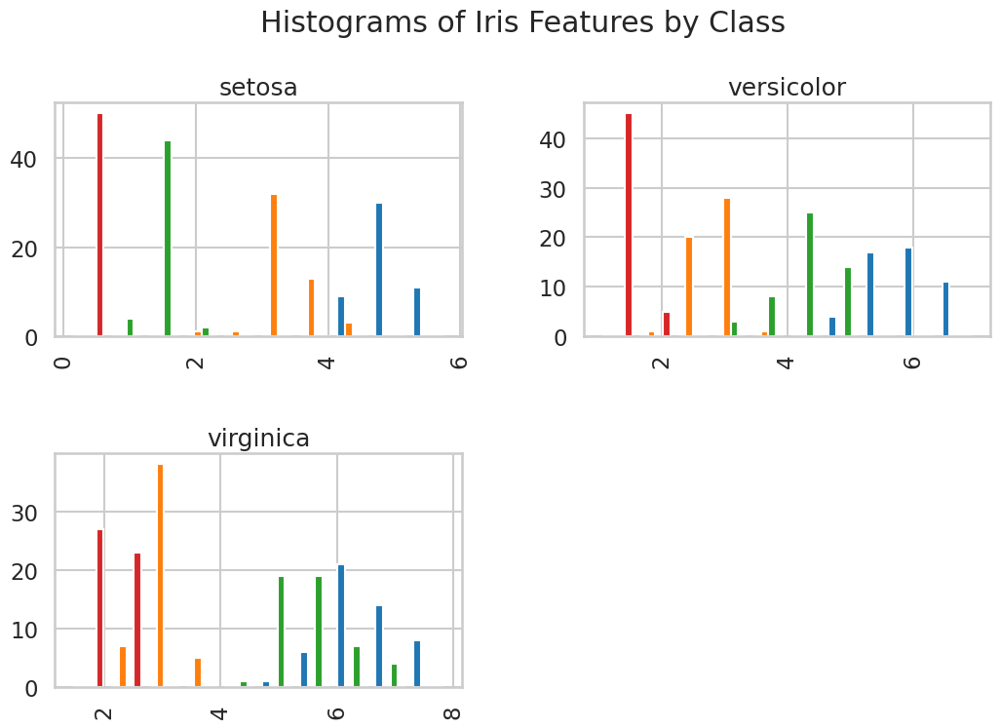

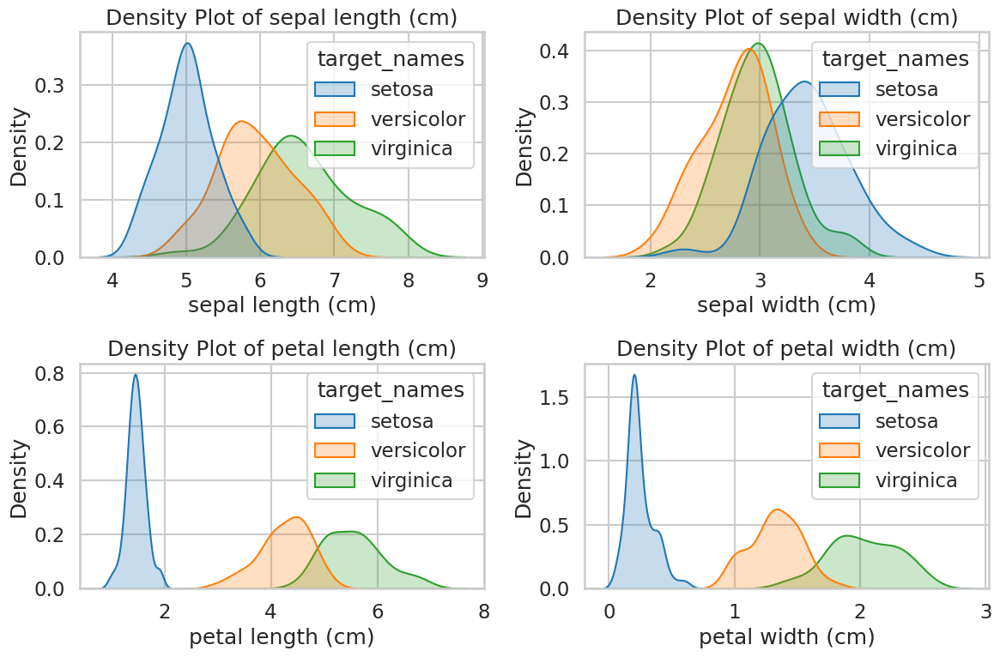

In [20]:
# Histograms for each feature, separated by class
df.hist(column=iris.feature_names, by='target_names', figsize=(12, 8), layout=(2, 2))
plt.suptitle("Histograms of Iris Features by Class", y=1.02)
plt.show()

# Density plots (using Seaborn)
plt.figure(figsize=(12, 8))
for i, feature in enumerate(iris.feature_names):
    plt.subplot(2, 2, i + 1)
    sns.kdeplot(data=df, x=feature, hue='target_names', fill=True)
    plt.title(f'Density Plot of {feature}')
plt.tight_layout()
plt.show()

In [ ]:
#The above visualisations to help understand the dataset before performing any scalling or clustering:
#the dataset has 4 features which are (sepall length, spetal width,petal length, petal width )
#So, for each of the 150 iris flowers in the dataset, the sepal length and sepal width were carefully measured and recorded,
#along with the petal length and petal width.
#These four measurements are the features used to distinguish between the three different species of iris:
#Iris setosa, Iris versicolor, and Iris virginica.
#For the first visualization:
#Pair Plots (Scatter Matrix):
# Helps identify potential linear or non-linear relationships between different pairs of features.
#You can also visually assess if the classes are well-separated in any of the 2D feature spaces.
#Second one  Scatter Plots (for specific feature pairs):
#Allows for a more focused view of the relationship between two chosen features and how the classes are distributed.
#You can experiment with different feature combinations.
#3rd one Histograms and Density Plots:
#Helps understand the range, central tendency, and spread of each feature within each class.
#You can see if the distributions of a particular feature differ significantly across the classes.

* Repeat all the above clustering approaches and steps on the above data.
* Comment on the effect of scaling on clustering this dataset. Show the difference between clustering the data with and without   scaling.
* Compare between the different clustering approaches.
* Is your clustering outcome consistent with the labels?

## **K-Means Without Scalling**

Silhouette Score for k=2 (Without Scaling): 0.6810
Silhouette Score for k=3 (Without Scaling): 0.5528
Silhouette Score for k=4 (Without Scaling): 0.4981
Silhouette Score for k=5 (Without Scaling): 0.4912
Silhouette Score for k=6 (Without Scaling): 0.3648
Silhouette Score for k=7 (Without Scaling): 0.3543
Silhouette Score for k=8 (Without Scaling): 0.3487
Silhouette Score for k=9 (Without Scaling): 0.3125
Silhouette Score for k=10 (Without Scaling): 0.3180

Optimal number of clusters (based on Silhouette Score, With Scaling): 2
Best Silhouette Score (With Scaling): 0.6810


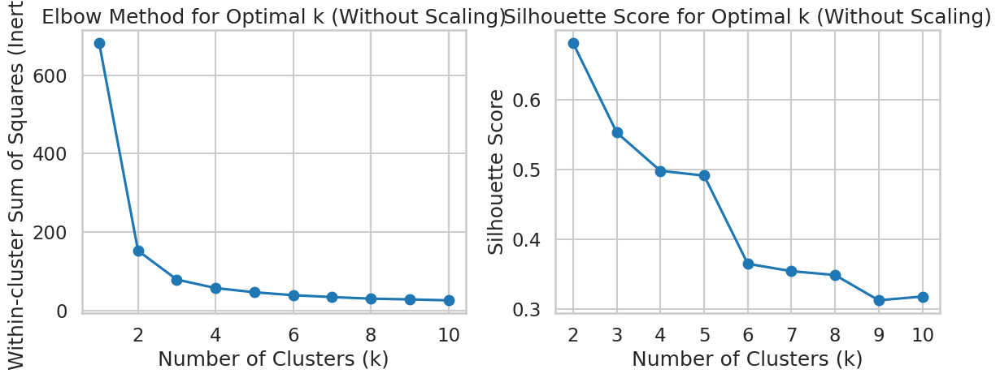

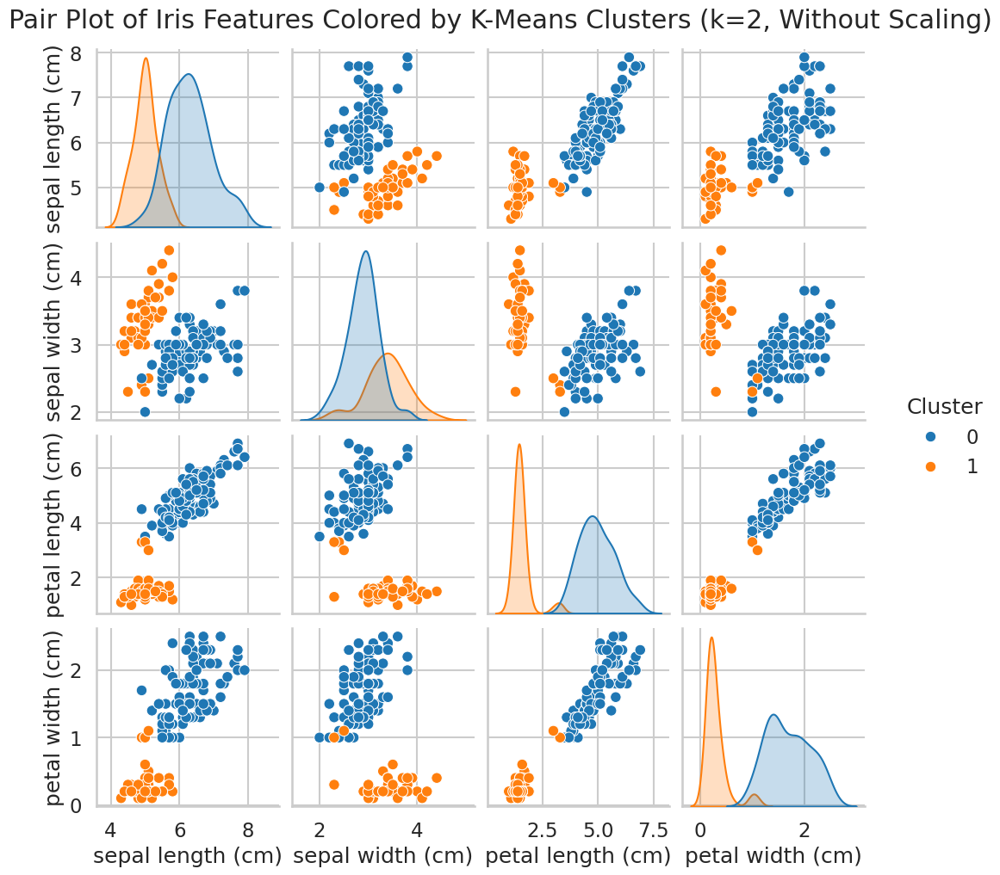

In [21]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import load_iris
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import pandas as pd
import seaborn as sns

# Load the Iris dataset
iris = load_iris()
X = iris.data
feature_names = iris.feature_names

# 1. Elbow Method (without scaling)
inertia = []
for i in range(1, 11):  # Try numbers of clusters from 1 to 10
    kmeans = KMeans(n_clusters=i, random_state=42, n_init=10)
    kmeans.fit(X)
    inertia.append(kmeans.inertia_)

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(range(1, 11), inertia, marker='o')
plt.title('Elbow Method for Optimal k (Without Scaling)')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Within-cluster Sum of Squares (Inertia)')
plt.grid(True)

# 2. Silhouette Score (without scaling)
silhouette_scores = {}
for i in range(2, 11):  # Silhouette score needs at least 2 clusters
    kmeans = KMeans(n_clusters=i, random_state=42, n_init=10)
    labels = kmeans.fit_predict(X)
    silhouette_avg = silhouette_score(X, labels)
    silhouette_scores[i] = silhouette_avg
    print(f"Silhouette Score for k={i} (Without Scaling): {silhouette_avg:.4f}")

# Determine optimal k based on silhouette score
optimal_k_silhouette = max(silhouette_scores, key=silhouette_scores.get)
best_silhouette_score = silhouette_scores[optimal_k_silhouette]

print(f"\nOptimal number of clusters (based on Silhouette Score, With Scaling): {optimal_k_silhouette}")
print(f"Best Silhouette Score (With Scaling): {best_silhouette_score:.4f}")

# Plot Silhouette Scores
plt.subplot(1, 2, 2)
plt.plot(silhouette_scores.keys(), silhouette_scores.values(), marker='o')
plt.title('Silhouette Score for Optimal k (Without Scaling)')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Silhouette Score')
plt.xticks(range(2, 11))
plt.grid(True)

plt.tight_layout()
plt.show()

# Now use the optimal_k_silhouette for your final clustering and visualization (without scaling)
optimal_k = optimal_k_silhouette  # Set the optimal k
kmeans_optimal = KMeans(n_clusters=optimal_k, random_state=42, n_init=10)
labels_optimal = kmeans_optimal.fit_predict(X)

# Create a Pandas DataFrame for easier plotting
df = pd.DataFrame(X, columns=feature_names)
df['Cluster'] = labels_optimal

# Pair plots colored by cluster (without scaling)
sns.pairplot(df, hue='Cluster', diag_kind='kde')
plt.suptitle(f'Pair Plot of Iris Features Colored by K-Means Clusters (k={optimal_k}, Without Scaling)', y=1.02)
plt.show()



In [ ]:
#from observing the results we can see that before scaling Without scaling, the K-Means algorithm will be more
#sensitive to the features that have larger numerical values. In the Iris dataset, petal length and petal width generally have larger values
#than sepal length and sepal width. This might lead to the clustering being primarily driven by the petal dimensions.
#The K-means algorithm suggested that the Iris dataset is optimally separated into two clusters.
#However, the dataset is known to represent three different species of iris.
#This finding of two clusters instead of three could be attributed to the considerable similarity between the Versicolor and Virginica species.
#Because K-means relies on minimizing the distance between data points within a cluster,
#the algorithm might have concluded that these two close species should belong to the same cluster, failing to distinguish them as distinct entities.

## **K-Means With Scaling**

Silhouette Score for k=2 (With Scaling): 0.5818
Silhouette Score for k=3 (With Scaling): 0.4599
Silhouette Score for k=4 (With Scaling): 0.3869
Silhouette Score for k=5 (With Scaling): 0.3459
Silhouette Score for k=6 (With Scaling): 0.3171
Silhouette Score for k=7 (With Scaling): 0.3202
Silhouette Score for k=8 (With Scaling): 0.3387
Silhouette Score for k=9 (With Scaling): 0.3424
Silhouette Score for k=10 (With Scaling): 0.3518

Optimal number of clusters (based on Silhouette Score, With Scaling): 2
Best Silhouette Score (With Scaling): 0.5818


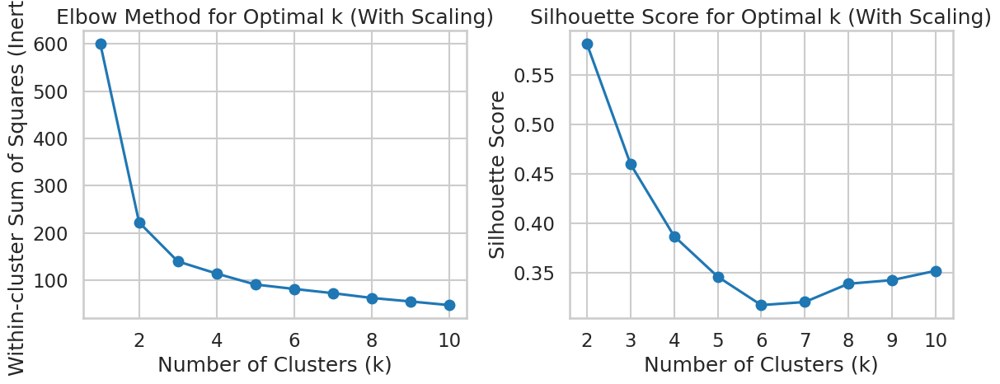

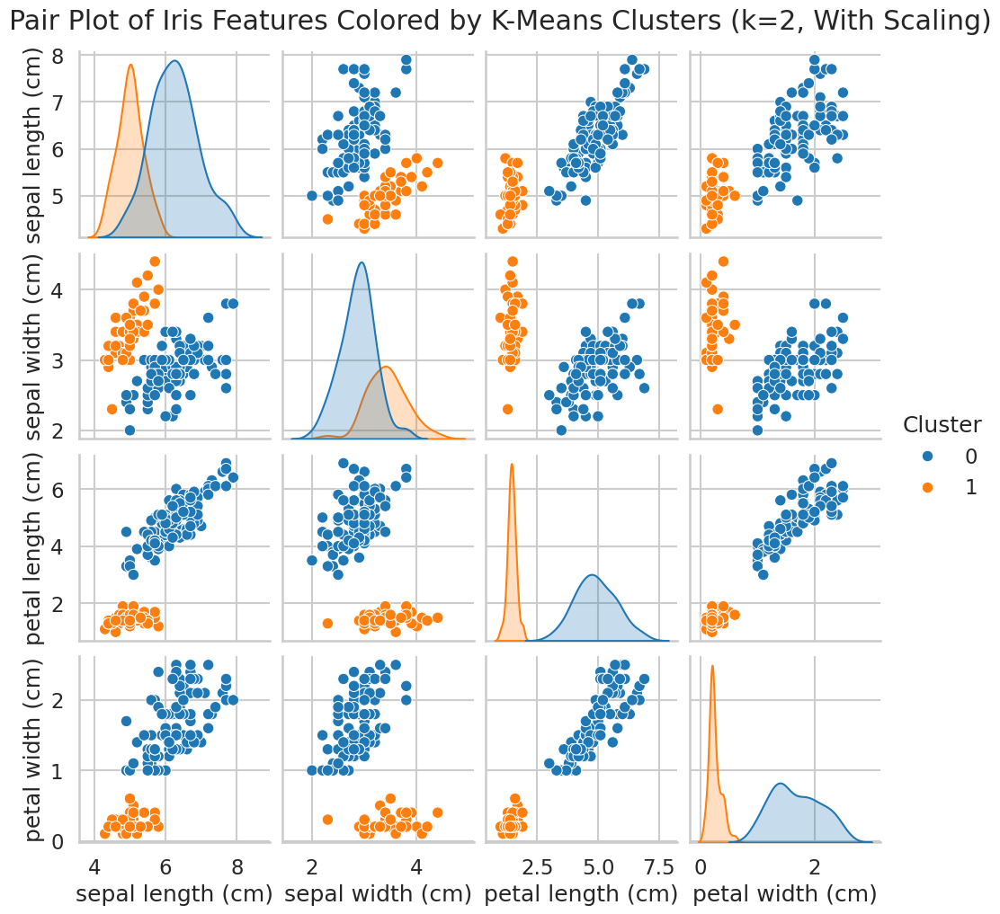

In [22]:
from sklearn.preprocessing import StandardScaler
# Load the Iris dataset
iris = load_iris()
X = iris.data
feature_names = iris.feature_names

# Scale the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# 1. Elbow Method (with scaling)
inertia = []
for i in range(1, 11):  # Try numbers of clusters from 1 to 10
    kmeans = KMeans(n_clusters=i, random_state=42, n_init=10)
    kmeans.fit(X_scaled)
    inertia.append(kmeans.inertia_)

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(range(1, 11), inertia, marker='o')
plt.title('Elbow Method for Optimal k (With Scaling)')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Within-cluster Sum of Squares (Inertia)')
plt.grid(True)

# 2. Silhouette Score (with scaling)
silhouette_scores = {}
for i in range(2, 11):  # Silhouette score needs at least 2 clusters
    kmeans = KMeans(n_clusters=i, random_state=42, n_init=10)
    labels = kmeans.fit_predict(X_scaled)
    silhouette_avg = silhouette_score(X_scaled, labels)
    silhouette_scores[i] = silhouette_avg
    print(f"Silhouette Score for k={i} (With Scaling): {silhouette_avg:.4f}")

# Determine optimal k based on silhouette score
optimal_k_silhouette = max(silhouette_scores, key=silhouette_scores.get)
best_silhouette_score = silhouette_scores[optimal_k_silhouette]

print(f"\nOptimal number of clusters (based on Silhouette Score, With Scaling): {optimal_k_silhouette}")
print(f"Best Silhouette Score (With Scaling): {best_silhouette_score:.4f}")
# Plot Silhouette Scores
plt.subplot(1, 2, 2)
plt.plot(silhouette_scores.keys(), silhouette_scores.values(), marker='o')
plt.title('Silhouette Score for Optimal k (With Scaling)')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Silhouette Score')
plt.xticks(range(2, 11))
plt.grid(True)

plt.tight_layout()
plt.show()

# Now use the optimal_k_silhouette for your final clustering and visualization (with scaling)
optimal_k = optimal_k_silhouette  # Set the optimal k
kmeans_optimal = KMeans(n_clusters=optimal_k, random_state=42, n_init=10)
labels_optimal = kmeans_optimal.fit_predict(X_scaled)

# Create a Pandas DataFrame for easier plotting
df = pd.DataFrame(X, columns=feature_names)
df['Cluster'] = labels_optimal

# Pair plots colored by cluster (with scaling)
sns.pairplot(df, hue='Cluster', diag_kind='kde')
plt.suptitle(f'Pair Plot of Iris Features Colored by K-Means Clusters (k={optimal_k}, With Scaling)', y=1.02)
plt.show()


In [ ]:
#Despite applying scaling techniques, the Versicolor and Virginica iris varieties remain highly similar in their feature characteristics.
#This continued resemblance causes the K-means algorithm to suggest a division into only two clusters.
#K-means is most effective when identifying clusters that are distinctly separated and have a compact, roughly spherical shape.
#The Iris dataset deviates from this ideal, as the clusters, especially those of Versicolor and Virginica, are more elongated and tend to overlap.

# **K-Means with Scaling (K=3)**

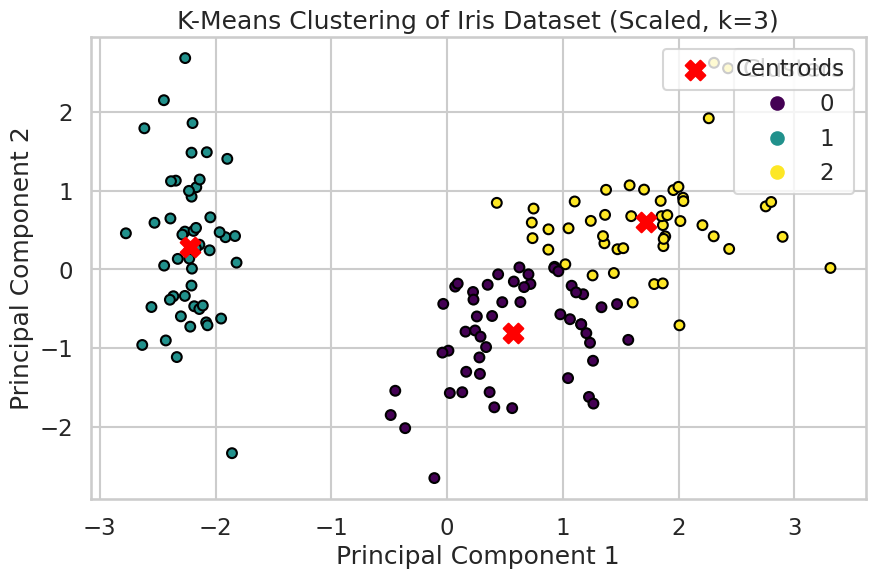

Silhouette Score (Scaled, k=3): 0.460
Adjusted Rand Index (ARI) (Scaled, k=3): 0.620

Cluster Assignments vs. Original Classes (Scaled, k=3):

Cluster 0:
  Number of data points: 53
  Original classes: (array([1, 2]), array([39, 14]))

Cluster 1:
  Number of data points: 50
  Original classes: (array([0]), array([50]))

Cluster 2:
  Number of data points: 47
  Original classes: (array([1, 2]), array([11, 36]))


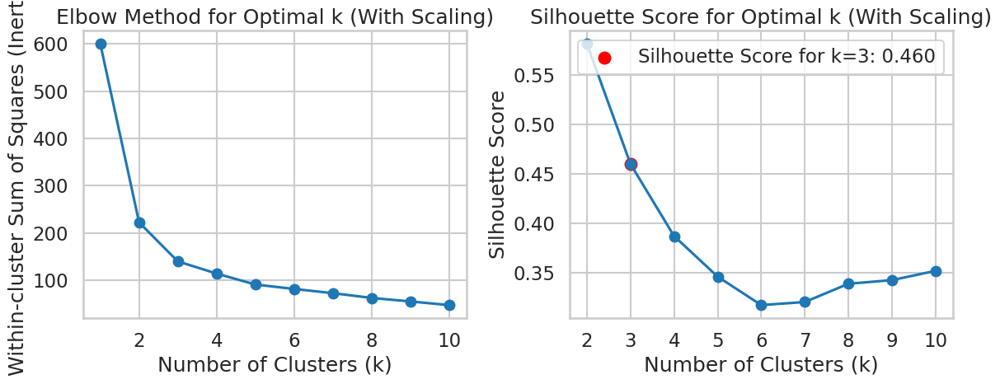

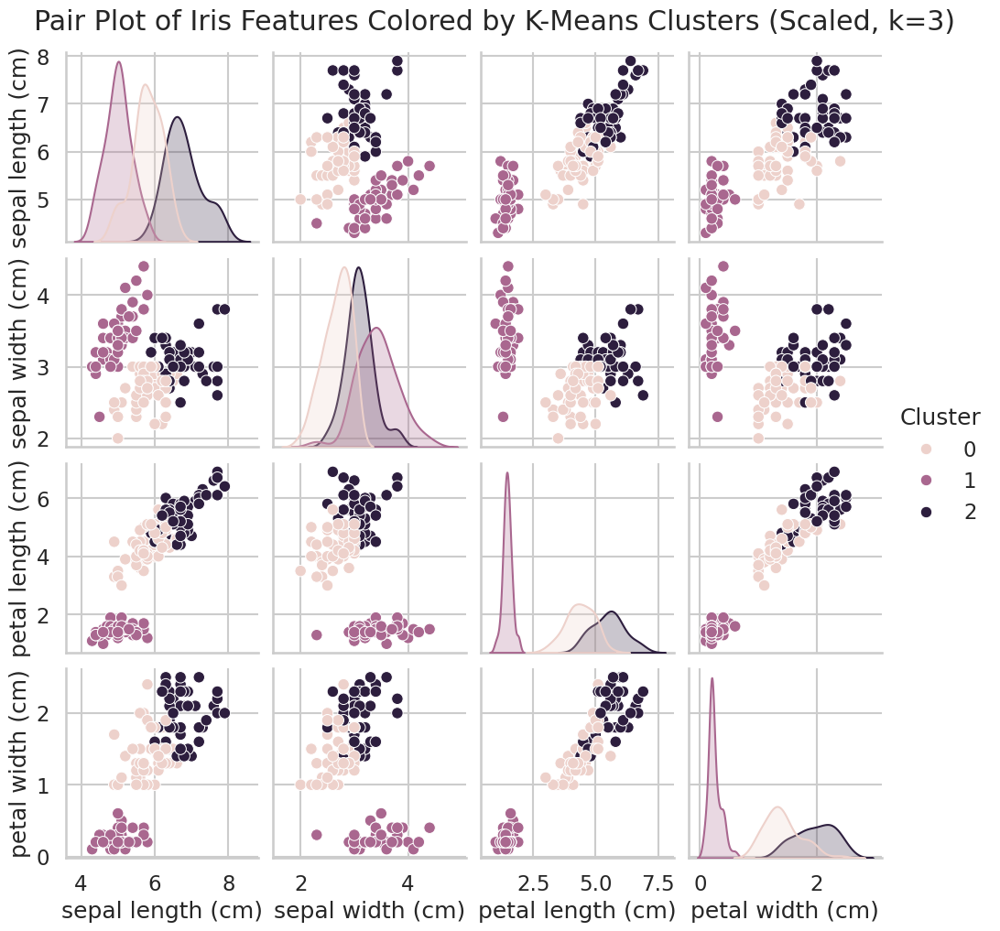

In [26]:
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score, adjusted_rand_score
from sklearn.datasets import load_iris
iris = load_iris()
X = iris.data
y = iris.target
# Perform K-Means clustering with k=3 (scaled data)
n_clusters = 3
kmeans_k3 = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
labels_k3 = kmeans_k3.fit_predict(X_scaled)
centroids_k3 = kmeans_k3.cluster_centers_

# Visualize the clusters (k=3) using PCA
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

plt.figure(figsize=(10, 6))
scatter = plt.scatter(X_pca[:, 0], X_pca[:, 1], c=labels_k3, cmap='viridis', edgecolor='k', s=50)
plt.scatter(pca.transform(centroids_k3)[:, 0], pca.transform(centroids_k3)[:, 1], marker='X', s=200, color='red', label='Centroids')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title(f'K-Means Clustering of Iris Dataset (Scaled, k={n_clusters})')
legend1 = plt.legend(*scatter.legend_elements(), title="Clusters")
plt.gca().add_artist(legend1)
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Evaluate the clustering (k=3)
silhouette_avg_k3 = silhouette_score(X_scaled, labels_k3)
ari_k3 = adjusted_rand_score(y, labels_k3)
print(f"Silhouette Score (Scaled, k={n_clusters}): {silhouette_avg_k3:.3f}")
print(f"Adjusted Rand Index (ARI) (Scaled, k={n_clusters}): {ari_k3:.3f}")
print("\nCluster Assignments vs. Original Classes (Scaled, k=3):")
for i in range(n_clusters):
    cluster_indices = np.where(labels_k3 == i)[0]
    original_classes_in_cluster = y[cluster_indices]
    print(f"\nCluster {i}:")
    print(f"  Number of data points: {len(cluster_indices)}")
    print(f"  Original classes: {np.unique(original_classes_in_cluster, return_counts=True)}")

# Elbow Method (for a range of k)
inertia = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, random_state=42, n_init=10)
    kmeans.fit(X_scaled)
    inertia.append(kmeans.inertia_)

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(range(1, 11), inertia, marker='o')
plt.title('Elbow Method for Optimal k (With Scaling)')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Within-cluster Sum of Squares (Inertia)')
plt.grid(True)

# Silhouette Score (for a range of k)
silhouette_scores = {}
for i in range(2, 11):
    kmeans = KMeans(n_clusters=i, random_state=42, n_init=10)
    labels = kmeans.fit_predict(X_scaled)
    silhouette_avg = silhouette_score(X_scaled, labels)
    silhouette_scores[i] = silhouette_avg

plt.subplot(1, 2, 2)
plt.plot(silhouette_scores.keys(), silhouette_scores.values(), marker='o')
plt.scatter(3, silhouette_scores.get(3), color='red', marker='o', s=100, label=f'Silhouette Score for k=3: {silhouette_scores.get(3):.3f}') # Highlight k=3
plt.title('Silhouette Score for Optimal k (With Scaling)')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Silhouette Score')
plt.xticks(range(2, 11))
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()



# Pair plots colored by cluster (scaled data - using original feature names for clarity)
df_combined = pd.DataFrame(X, columns=feature_names)
df_combined['Cluster'] = labels_k3
sns.pairplot(df_combined, hue='Cluster', diag_kind='kde')
plt.suptitle(f'Pair Plot of Iris Features Colored by K-Means Clusters (Scaled, k={n_clusters})', y=1.02)
plt.show()

In [ ]:
#As shown in the results there is two clusters very simmiler to each othe so K-means faild to distinguish between them
## Even after scaling, Versicolor and Virginica remain very similar, making K-Means think they should be in the same cluster (K=2).
# K-Means works best when clusters are well-separated and compact (circular blobs).
# In the Iris dataset, clusters are not perfectly spherical—especially Versicolor and Virginica, which are more elongated and overlapping.

# **Agglomerative clustering without scaling**

Evaluating Agglomerative Clustering with various parameters (Without Scaling):
Linkage: ward, Affinity: euclidean, Threshold: 0.10, Clusters: 147, Silhouette Score: 0.0211
Linkage: ward, Affinity: euclidean, Threshold: 0.30, Clusters: 94, Silhouette Score: 0.2211
Linkage: ward, Affinity: euclidean, Threshold: 0.50, Clusters: 57, Silhouette Score: 0.2888
Linkage: ward, Affinity: euclidean, Threshold: 0.71, Clusters: 41, Silhouette Score: 0.2854
Linkage: ward, Affinity: euclidean, Threshold: 0.91, Clusters: 28, Silhouette Score: 0.2692
Linkage: ward, Affinity: euclidean, Threshold: 1.11, Clusters: 22, Silhouette Score: 0.2831
Linkage: ward, Affinity: euclidean, Threshold: 1.31, Clusters: 18, Silhouette Score: 0.2740
Linkage: ward, Affinity: euclidean, Threshold: 1.51, Clusters: 15, Silhouette Score: 0.2695
Linkage: ward, Affinity: euclidean, Threshold: 1.72, Clusters: 14, Silhouette Score: 0.2616
Linkage: ward, Affinity: euclidean, Threshold: 1.92, Clusters: 10, Silhouette Score: 0.2925


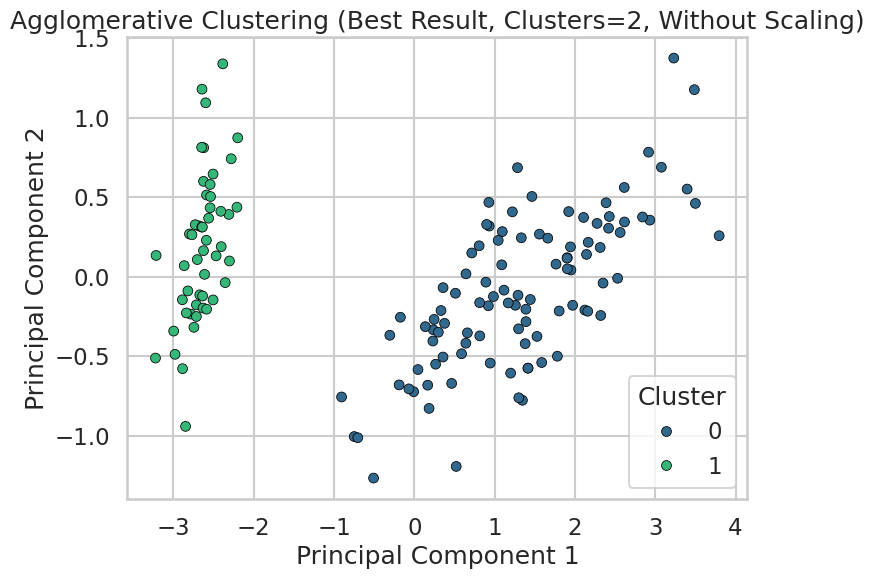

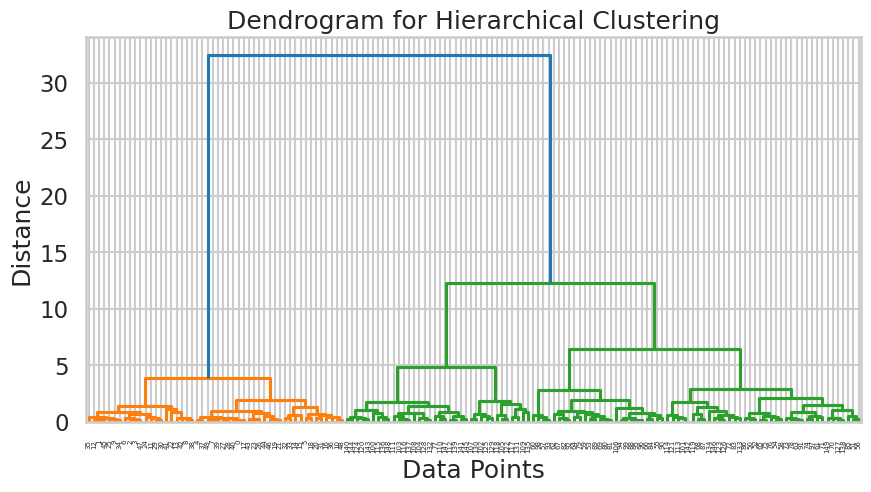

In [32]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score
from scipy.cluster.hierarchy import linkage, dendrogram
from itertools import product

# Load the Iris dataset
iris = load_iris()
X = iris.data
y = iris.target
feature_names = iris.feature_names

# Define parameters to iterate over
linkages = ['ward', 'complete', 'average', 'single']
affinities = ['euclidean', 'manhattan']
thresholds = np.linspace(0.1, 10, 50)  # Wide range of thresholds

best_silhouette_score = -1
best_params = {}
all_silhouette_scores = {}

print("Evaluating Agglomerative Clustering with various parameters (Without Scaling):")

for linkage_type, affinity_type in product(linkages, affinities):
    if linkage_type == 'ward' and affinity_type != 'euclidean':
        continue  # Ward linkage only works with Euclidean distance

    for threshold in thresholds:
        # Perform Agglomerative Clustering with a distance_threshold
        agg_clustering = AgglomerativeClustering(
            n_clusters=None,  # We use distance_threshold instead of n_clusters
            distance_threshold=threshold,
            linkage=linkage_type,
            metric=affinity_type
        )
        try:
            labels = agg_clustering.fit_predict(X)  # Using unscaled data X
            n_clusters = len(np.unique(labels))

            # Silhouette Score requires at least 2 clusters
            if n_clusters > 1 and n_clusters < len(X):
                silhouette_avg = silhouette_score(X, labels)  # Using unscaled data X
                current_params = {'linkage': linkage_type, 'affinity': affinity_type, 'threshold': threshold, 'n_clusters': n_clusters}
                all_silhouette_scores[tuple(current_params.values())] = silhouette_avg

                if silhouette_avg > best_silhouette_score:
                    best_silhouette_score = silhouette_avg
                    best_params = current_params
                    best_labels = labels
                    best_n_clusters = n_clusters

                print(f"Linkage: {linkage_type}, Affinity: {affinity_type}, Threshold: {threshold:.2f}, Clusters: {n_clusters}, Silhouette Score: {silhouette_avg:.4f}")

        except ValueError as e:
            # Handle cases where distance_threshold might lead to a single cluster
            pass

print("\n--- Best Agglomerative Clustering Result (Without Scaling) ---")
if best_params:
    print(f"Best Linkage: {best_params['linkage']}")
    print(f"Best Affinity: {best_params['affinity']}")
    print(f"Best Threshold: {best_params['threshold']:.2f}")
    print(f"Best Number of Clusters: {best_params['n_clusters']}")
    print(f"Best Silhouette Score: {best_silhouette_score:.4f}")

    # Visualize the best clustering result (without scaling)
    import pandas as pd
    import seaborn as sns
    from sklearn.decomposition import PCA

    pca = PCA(n_components=2)
    X_pca = pca.fit_transform(X)  # Using unscaled data X for PCA

    df = pd.DataFrame(X, columns=feature_names)
    df['Cluster'] = best_labels

    plt.figure(figsize=(8, 6))
    sns.scatterplot(x=X_pca[:, 0], y=X_pca[:, 1], hue='Cluster', palette='viridis', data=df, edgecolor='k', s=50)
    plt.title(f'Agglomerative Clustering (Best Result, Clusters={best_n_clusters}, Without Scaling)')
    plt.xlabel('Principal Component 1')
    plt.ylabel('Principal Component 2')
    plt.legend(title='Cluster')
    plt.grid(True)
    plt.show()

plt.figure(figsize=(10, 5))
linked = sch.linkage(X, method="ward")  # Use "ward" for a clear dendrogram
sch.dendrogram(linked)
plt.title("Dendrogram for Hierarchical Clustering")
plt.xlabel("Data Points")
plt.ylabel("Distance")
plt.show()

# **Agglomerative clustering with scaling**

Evaluating Agglomerative Clustering with various parameters (With Scaling):
Linkage: ward, Affinity: euclidean, Threshold: 0.10, Clusters: 147, Silhouette Score: 0.0211
Linkage: ward, Affinity: euclidean, Threshold: 0.30, Clusters: 94, Silhouette Score: 0.2211
Linkage: ward, Affinity: euclidean, Threshold: 0.50, Clusters: 57, Silhouette Score: 0.2888
Linkage: ward, Affinity: euclidean, Threshold: 0.71, Clusters: 41, Silhouette Score: 0.2854
Linkage: ward, Affinity: euclidean, Threshold: 0.91, Clusters: 28, Silhouette Score: 0.2692
Linkage: ward, Affinity: euclidean, Threshold: 1.11, Clusters: 22, Silhouette Score: 0.2831
Linkage: ward, Affinity: euclidean, Threshold: 1.31, Clusters: 18, Silhouette Score: 0.2740
Linkage: ward, Affinity: euclidean, Threshold: 1.51, Clusters: 15, Silhouette Score: 0.2695
Linkage: ward, Affinity: euclidean, Threshold: 1.72, Clusters: 14, Silhouette Score: 0.2616
Linkage: ward, Affinity: euclidean, Threshold: 1.92, Clusters: 10, Silhouette Score: 0.2925
Lin

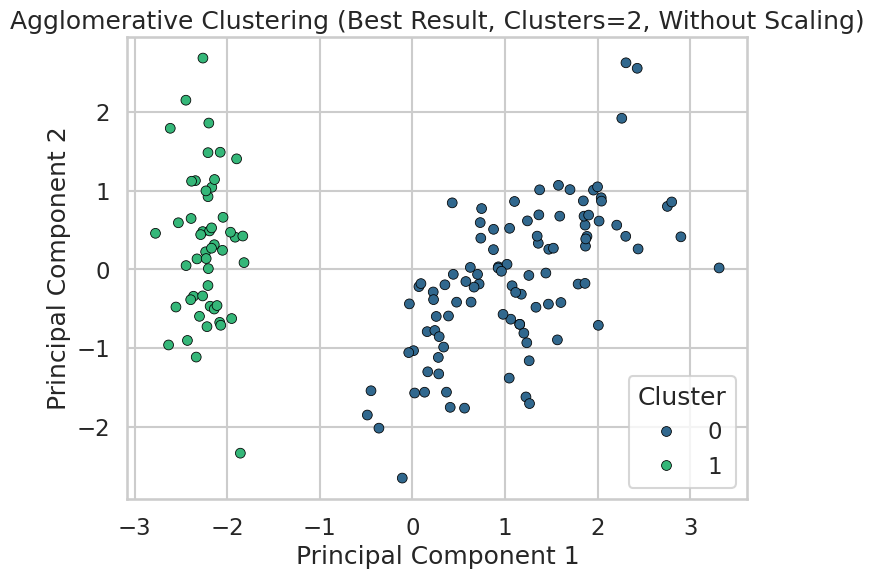

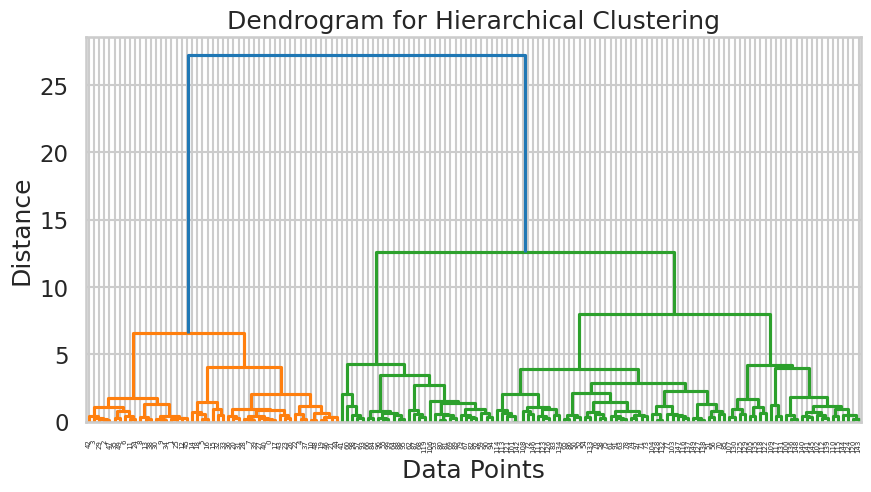

In [30]:
from sklearn.preprocessing import StandardScaler

# Scale the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Define parameters to iterate over
linkages = ['ward', 'complete', 'average', 'single']
affinities = ['euclidean', 'manhattan']
thresholds = np.linspace(0.1, 10, 50)  # Wide range of thresholds

best_silhouette_score = -1
best_params = {}
all_silhouette_scores = {}

print("Evaluating Agglomerative Clustering with various parameters (With Scaling):")

for linkage_type, affinity_type in product(linkages, affinities):
    if linkage_type == 'ward' and affinity_type != 'euclidean':
        continue  # Ward linkage only works with Euclidean distance

    for threshold in thresholds:
        # Perform Agglomerative Clustering with a distance_threshold
        agg_clustering = AgglomerativeClustering(
            n_clusters=None,  # We use distance_threshold instead of n_clusters
            distance_threshold=threshold,
            linkage=linkage_type,
            metric=affinity_type
        )
        try:
            labels = agg_clustering.fit_predict(X)  # Using unscaled data X
            n_clusters = len(np.unique(labels))

            # Silhouette Score requires at least 2 clusters
            if n_clusters > 1 and n_clusters < len(X):
                silhouette_avg = silhouette_score(X, labels)  # Using unscaled data X
                current_params = {'linkage': linkage_type, 'affinity': affinity_type, 'threshold': threshold, 'n_clusters': n_clusters}
                all_silhouette_scores[tuple(current_params.values())] = silhouette_avg

                if silhouette_avg > best_silhouette_score:
                    best_silhouette_score = silhouette_avg
                    best_params = current_params
                    best_labels = labels
                    best_n_clusters = n_clusters

                print(f"Linkage: {linkage_type}, Affinity: {affinity_type}, Threshold: {threshold:.2f}, Clusters: {n_clusters}, Silhouette Score: {silhouette_avg:.4f}")

        except ValueError as e:
            # Handle cases where distance_threshold might lead to a single cluster
            pass

print("\n--- Best Agglomerative Clustering Result (With Scaling) ---")
if best_params:
    print(f"Best Linkage: {best_params['linkage']}")
    print(f"Best Affinity: {best_params['affinity']}")
    print(f"Best Threshold: {best_params['threshold']:.2f}")
    print(f"Best Number of Clusters: {best_params['n_clusters']}")
    print(f"Best Silhouette Score: {best_silhouette_score:.4f}")

    # Visualize the best clustering result (without scaling)
    import pandas as pd
    import seaborn as sns
    from sklearn.decomposition import PCA

    pca = PCA(n_components=2)
    X_pca = pca.fit_transform(X_scaled)  # Using unscaled data X for PCA

    df = pd.DataFrame(X, columns=feature_names)
    df['Cluster'] = best_labels

    plt.figure(figsize=(8, 6))
    sns.scatterplot(x=X_pca[:, 0], y=X_pca[:, 1], hue='Cluster', palette='viridis', data=df, edgecolor='k', s=50)
    plt.title(f'Agglomerative Clustering (Best Result, Clusters={best_n_clusters}, Without Scaling)')
    plt.xlabel('Principal Component 1')
    plt.ylabel('Principal Component 2')
    plt.legend(title='Cluster')
    plt.grid(True)
    plt.show()

plt.figure(figsize=(10, 5))
linked = sch.linkage(X_scaled, method="ward")  # Use "ward" for a clear dendrogram
sch.dendrogram(linked)
plt.title("Dendrogram for Hierarchical Clustering")
plt.xlabel("Data Points")
plt.ylabel("Distance")
plt.show()


In [ ]:
#Although the visual output of Agglomerative Clustering was largely unchanged by scaling, with similar data point assignments to clusters,
#the numerical evaluation told a different story. The Silhouette Score saw a notable improvement after scaling (rising from 0.58 to 0.68),
#indicating a better quality of clusters in the scaled data. Additionally, the parameters deemed optimal for the clustering process were different
#after scaling. This suggests that while the overall structure of the clusters was somewhat stable, scaling did impact the underlying distance
#relationships enough to affect the Silhouette Score and the best-performing configuration. Unlike K-Means, which is sensitive to the scale of
#features due to its reliance on Euclidean distances and variance, Agglomerative Clustering's hierarchical approach, particularly with linkage
#methods like Ward and Complete, makes it more robust as it focuses on relative similarities. The observation of similar visual clusters alongside
#a changed Silhouette Score and optimal parameters implies that scaling primarily influenced the quantitative assessment of the clusters rather
#than their fundamental composition.

# **DBSCAN without Scaling**

Evaluating DBSCAN with various parameters (Without Scaling):
  eps: 0.10, min_samples: 2, Clusters: 4, Silhouette Score: -0.5334
  eps: 0.10, min_samples: 3, Clusters: 0 (Silhouette score not calculated)
  eps: 0.10, min_samples: 4, Clusters: 0 (Silhouette score not calculated)
  eps: 0.10, min_samples: 5, Clusters: 0 (Silhouette score not calculated)
  eps: 0.10, min_samples: 6, Clusters: 0 (Silhouette score not calculated)
  eps: 0.10, min_samples: 7, Clusters: 0 (Silhouette score not calculated)
  eps: 0.10, min_samples: 8, Clusters: 0 (Silhouette score not calculated)
  eps: 0.10, min_samples: 9, Clusters: 0 (Silhouette score not calculated)
  eps: 0.10, min_samples: 10, Clusters: 0 (Silhouette score not calculated)
  eps: 0.20, min_samples: 2, Clusters: 19, Silhouette Score: -0.2521
  eps: 0.20, min_samples: 3, Clusters: 6, Silhouette Score: -0.3435
  eps: 0.20, min_samples: 4, Clusters: 3, Silhouette Score: -0.3298
  eps: 0.20, min_samples: 5, Clusters: 2, Silhouette Score: 0.182

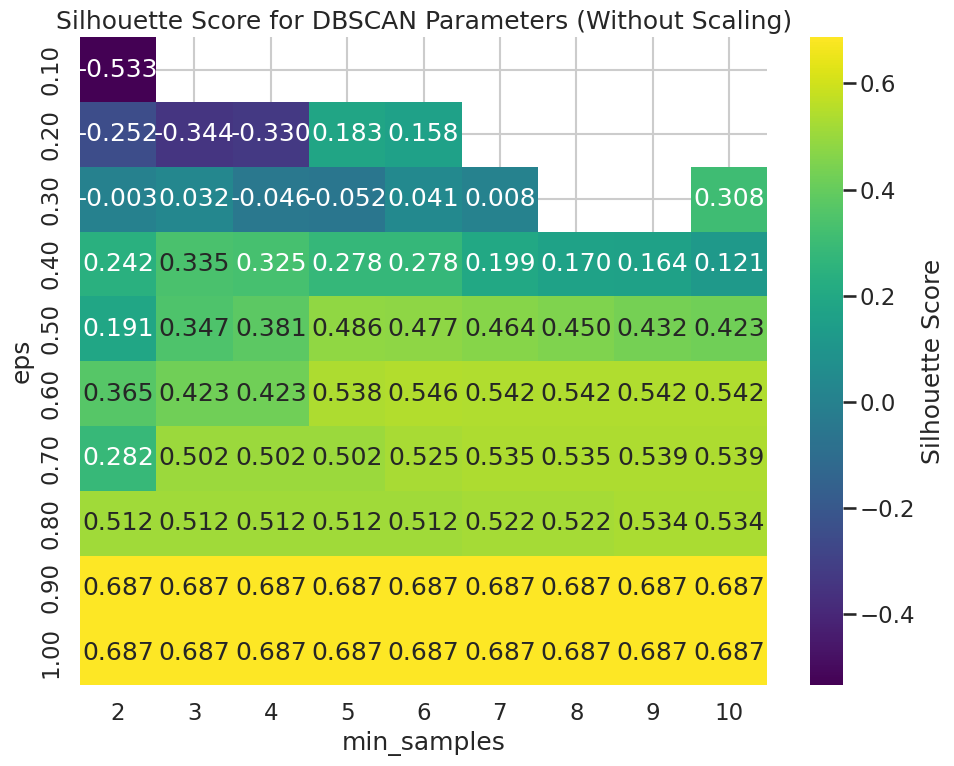


--- Best DBSCAN Parameters (Without Scaling) ---
Best eps: 0.90
Best min_samples: 2
Number of Clusters: 2
Best Silhouette Score: 0.6867


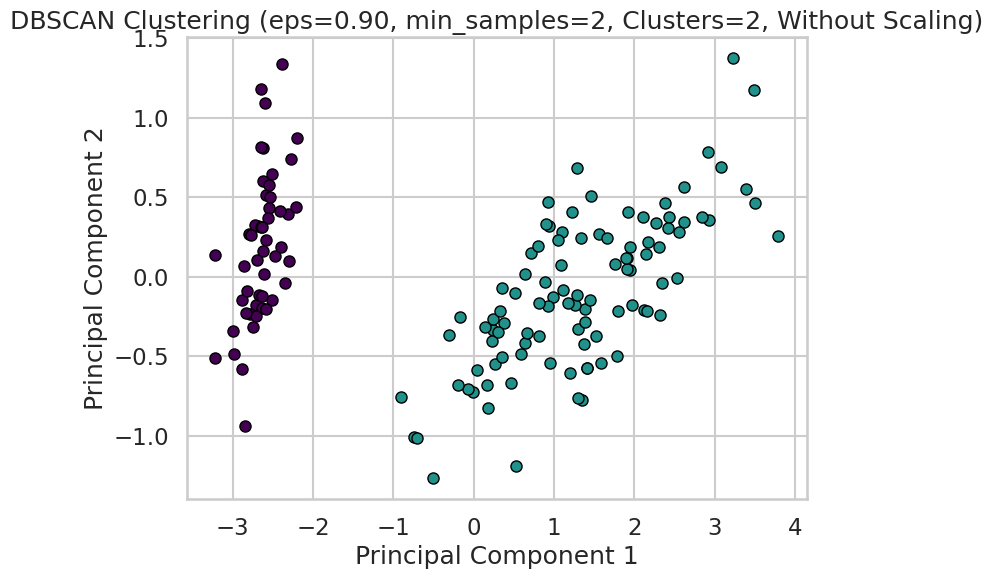

In [33]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.datasets import load_iris
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score
from sklearn.metrics import pairwise_distances
from sklearn.decomposition import PCA

# Load the Iris dataset
iris = load_iris()
X = iris.data
feature_names = iris.feature_names

# Define the ranges for eps and min_samples
eps_range = np.linspace(0.1, 1.0, 10)
min_samples_range = range(2, 11)

silhouette_scores = np.zeros((len(eps_range), len(min_samples_range)))
n_clusters = np.zeros((len(eps_range), len(min_samples_range)))

best_silhouette_score = -1
best_eps = None
best_min_samples = None
best_labels = None

print("Evaluating DBSCAN with various parameters (Without Scaling):")

for i, eps in enumerate(eps_range):
    for j, min_samples in enumerate(min_samples_range):
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        labels = dbscan.fit_predict(X)  # Using unscaled data

        n_unique_clusters = len(set(labels)) - (1 if -1 in labels else 0) # Exclude noise

        if n_unique_clusters > 1:
            silhouette_avg = silhouette_score(X, labels)  # Using unscaled data
            silhouette_scores[i, j] = silhouette_avg
            n_clusters[i, j] = n_unique_clusters

            print(f"  eps: {eps:.2f}, min_samples: {min_samples}, Clusters: {n_unique_clusters}, Silhouette Score: {silhouette_avg:.4f}")

            if silhouette_avg > best_silhouette_score:
                best_silhouette_score = silhouette_avg
                best_eps = eps
                best_min_samples = min_samples
                best_labels = labels
        else:
            silhouette_scores[i, j] = np.nan
            n_clusters[i, j] = n_unique_clusters
            print(f"  eps: {eps:.2f}, min_samples: {min_samples}, Clusters: {n_unique_clusters} (Silhouette score not calculated)")

# --- Plot Silhouette Score Heatmap ---
plt.figure(figsize=(10, 8))
sns.heatmap(silhouette_scores, annot=True, cmap="viridis", fmt=".3f",
            xticklabels=min_samples_range, yticklabels=[f"{e:.2f}" for e in eps_range],
            cbar_kws={'label': 'Silhouette Score'})
plt.xlabel("min_samples")
plt.ylabel("eps")
plt.title("Silhouette Score for DBSCAN Parameters (Without Scaling)")
plt.tight_layout()
plt.show()

# --- Print Best Parameters and Results ---
print("\n--- Best DBSCAN Parameters (Without Scaling) ---")
if best_eps is not None:
    best_n_clusters = len(set(best_labels)) - (1 if -1 in best_labels else 0)
    print(f"Best eps: {best_eps:.2f}")
    print(f"Best min_samples: {best_min_samples}")
    print(f"Number of Clusters: {best_n_clusters}")
    print(f"Best Silhouette Score: {best_silhouette_score:.4f}")

    # --- Visualize Clustering with Best Parameters (using PCA for 2D) ---
    pca = PCA(n_components=2)
    X_pca = pca.fit_transform(X)  # Using unscaled data for PCA

    plt.figure(figsize=(8, 6))
    unique_labels = set(best_labels)
    colors = [plt.cm.viridis(i/float(len(unique_labels))) for i in range(len(unique_labels))]

    for k, col in zip(unique_labels, colors):
        if k == -1:
            col = 'black'  # Noise points

        class_member_mask = (best_labels == k)
        xy = X_pca[class_member_mask]
        plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=col, markeredgecolor='k', markersize=8)

    plt.title(f'DBSCAN Clustering (eps={best_eps:.2f}, min_samples={best_min_samples}, Clusters={best_n_clusters}, Without Scaling)')
    plt.xlabel('Principal Component 1')
    plt.ylabel('Principal Component 2')
    plt.grid(True)
    plt.show()

else:
    print("No valid clustering found with more than one cluster for the given parameters.")

# **DBSCAN With Scaling**

Evaluating DBSCAN with various parameters (With Scaling):
  eps: 0.10, min_samples: 2, Clusters: 1 (Silhouette score not calculated)
  eps: 0.10, min_samples: 3, Clusters: 0 (Silhouette score not calculated)
  eps: 0.10, min_samples: 4, Clusters: 0 (Silhouette score not calculated)
  eps: 0.10, min_samples: 5, Clusters: 0 (Silhouette score not calculated)
  eps: 0.10, min_samples: 6, Clusters: 0 (Silhouette score not calculated)
  eps: 0.10, min_samples: 7, Clusters: 0 (Silhouette score not calculated)
  eps: 0.10, min_samples: 8, Clusters: 0 (Silhouette score not calculated)
  eps: 0.10, min_samples: 9, Clusters: 0 (Silhouette score not calculated)
  eps: 0.10, min_samples: 10, Clusters: 0 (Silhouette score not calculated)
  eps: 0.20, min_samples: 2, Clusters: 15, Silhouette Score: -0.3711
  eps: 0.20, min_samples: 3, Clusters: 5, Silhouette Score: 0.0871
  eps: 0.20, min_samples: 4, Clusters: 2, Silhouette Score: 0.0251
  eps: 0.20, min_samples: 5, Clusters: 0 (Silhouette score not 

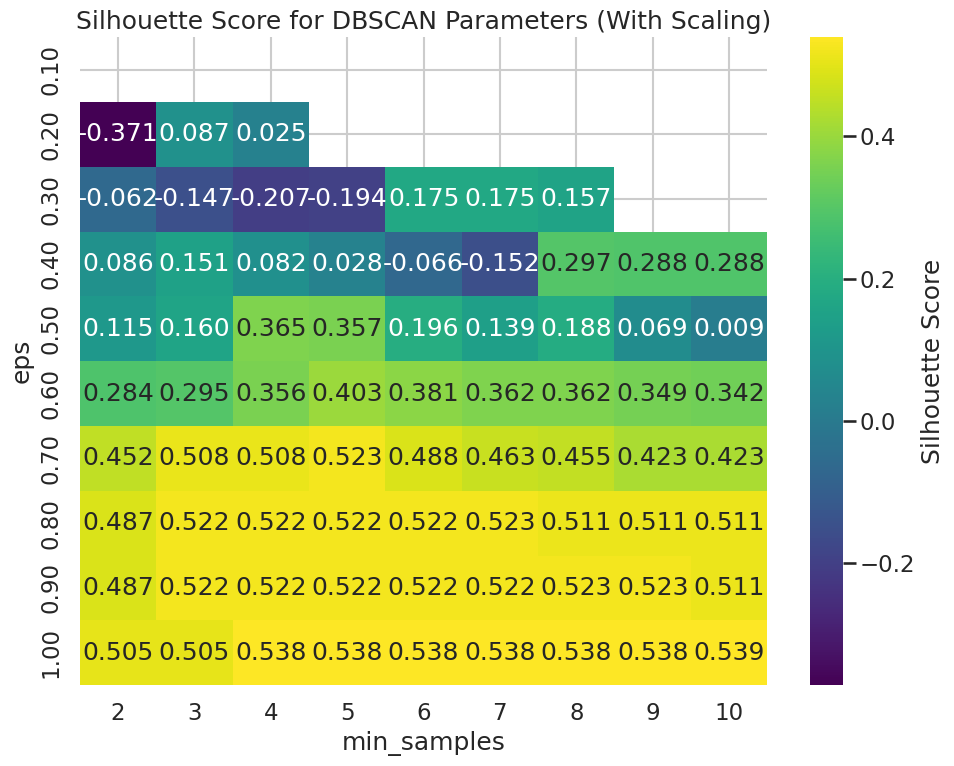


--- Best DBSCAN Parameters (With Scaling) ---
Best eps: 1.00
Best min_samples: 10
Number of Clusters: 2
Best Silhouette Score: 0.5390


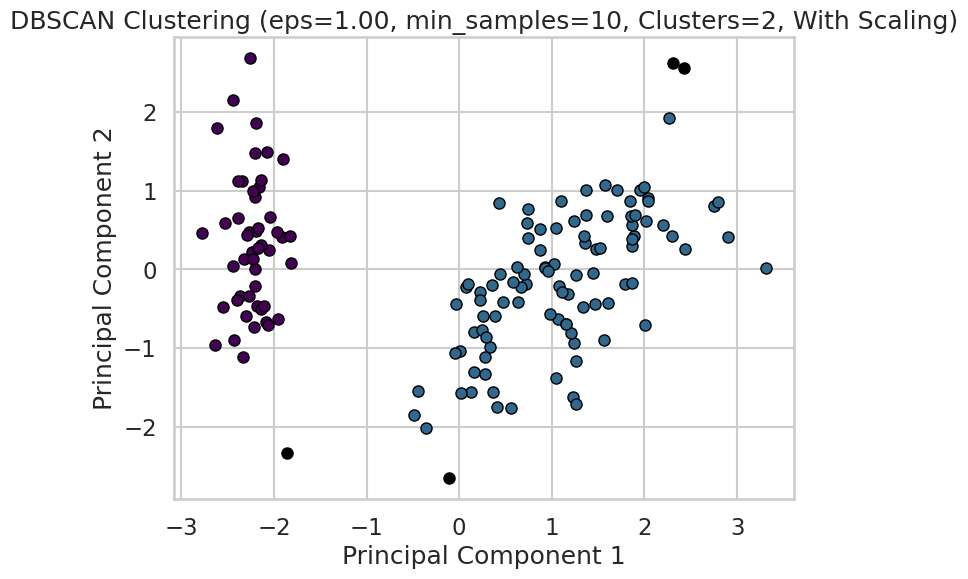

In [34]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.datasets import load_iris
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score
from sklearn.metrics import pairwise_distances
from sklearn.decomposition import PCA

# Load the Iris dataset
iris = load_iris()
X = iris.data
feature_names = iris.feature_names

# Scale the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Define the ranges for eps and min_samples
eps_range = np.linspace(0.1, 1.0, 10)
min_samples_range = range(2, 11)

silhouette_scores = np.zeros((len(eps_range), len(min_samples_range)))
n_clusters = np.zeros((len(eps_range), len(min_samples_range)))

best_silhouette_score = -1
best_eps = None
best_min_samples = None
best_labels = None

print("Evaluating DBSCAN with various parameters (With Scaling):")

for i, eps in enumerate(eps_range):
    for j, min_samples in enumerate(min_samples_range):
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        labels = dbscan.fit_predict(X_scaled)  # Using scaled data

        n_unique_clusters = len(set(labels)) - (1 if -1 in labels else 0) # Exclude noise

        if n_unique_clusters > 1:
            silhouette_avg = silhouette_score(X_scaled, labels)  # Using scaled data
            silhouette_scores[i, j] = silhouette_avg
            n_clusters[i, j] = n_unique_clusters

            print(f"  eps: {eps:.2f}, min_samples: {min_samples}, Clusters: {n_unique_clusters}, Silhouette Score: {silhouette_avg:.4f}")

            if silhouette_avg > best_silhouette_score:
                best_silhouette_score = silhouette_avg
                best_eps = eps
                best_min_samples = min_samples
                best_labels = labels
        else:
            silhouette_scores[i, j] = np.nan
            n_clusters[i, j] = n_unique_clusters
            print(f"  eps: {eps:.2f}, min_samples: {min_samples}, Clusters: {n_unique_clusters} (Silhouette score not calculated)")

# --- Plot Silhouette Score Heatmap ---
plt.figure(figsize=(10, 8))
sns.heatmap(silhouette_scores, annot=True, cmap="viridis", fmt=".3f",
            xticklabels=min_samples_range, yticklabels=[f"{e:.2f}" for e in eps_range],
            cbar_kws={'label': 'Silhouette Score'})
plt.xlabel("min_samples")
plt.ylabel("eps")
plt.title("Silhouette Score for DBSCAN Parameters (With Scaling)")
plt.tight_layout()
plt.show()

# --- Print Best Parameters and Results ---
print("\n--- Best DBSCAN Parameters (With Scaling) ---")
if best_eps is not None:
    best_n_clusters = len(set(best_labels)) - (1 if -1 in best_labels else 0)
    print(f"Best eps: {best_eps:.2f}")
    print(f"Best min_samples: {best_min_samples}")
    print(f"Number of Clusters: {best_n_clusters}")
    print(f"Best Silhouette Score: {best_silhouette_score:.4f}")

    # --- Visualize Clustering with Best Parameters (using PCA for 2D) ---
    pca = PCA(n_components=2)
    X_pca = pca.fit_transform(X_scaled)  # Using scaled data for PCA

    plt.figure(figsize=(8, 6))
    unique_labels = set(best_labels)
    colors = [plt.cm.viridis(i/float(len(unique_labels))) for i in range(len(unique_labels))]

    for k, col in zip(unique_labels, colors):
        if k == -1:
            col = 'black'  # Noise points

        class_member_mask = (best_labels == k)
        xy = X_pca[class_member_mask]
        plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=col, markeredgecolor='k', markersize=8)

    plt.title(f'DBSCAN Clustering (eps={best_eps:.2f}, min_samples={best_min_samples}, Clusters={best_n_clusters}, With Scaling)')
    plt.xlabel('Principal Component 1')
    plt.ylabel('Principal Component 2')
    plt.grid(True)
    plt.show()

else:
    print("No valid clustering found with more than one cluster for the given parameters.")

## Customer dataset
Repeat all the above on the customer data set

In [79]:
customer_df = pd.read_csv('/content/Customer data.csv')
customer_df.head()

,ID,Sex,Marital status,Age,Education,Income,Occupation,Settlement size
0,100000001,0,0,67,2,124670,1,2
1,100000002,1,1,22,1,150773,1,2
2,100000003,0,0,49,1,89210,0,0
3,100000004,0,0,45,1,171565,1,1
4,100000005,0,0,53,1,149031,1,1


In [80]:
customer_df = customer_df.fillna(0)
customer_df = pd.get_dummies(customer_df)
customer_df.head()

scaler = StandardScaler()
scaled_cdf = scaler.fit_transform(customer_df)
scaled_cdf = pd.DataFrame(scaled_cdf, columns=customer_df.columns)
scaled_cdf = scaled_cdf.drop(customer_df.columns[0], axis=1)
scaled_cdf.head()

,Sex,Marital status,Age,Education,Income,Occupation,Settlement size
0,-0.917399,-0.993024,2.653614,1.604323,0.097524,0.296823,1.552326
1,1.090038,1.007025,-1.187132,-0.063372,0.782654,0.296823,1.552326
2,-0.917399,-0.993024,1.117316,-0.063372,-0.833202,-1.269525,-0.909730
3,-0.917399,-0.993024,0.775916,-0.063372,1.328386,0.296823,0.321298
4,-0.917399,-0.993024,1.458716,-0.063372,0.736932,0.296823,0.321298


# **K-Means**

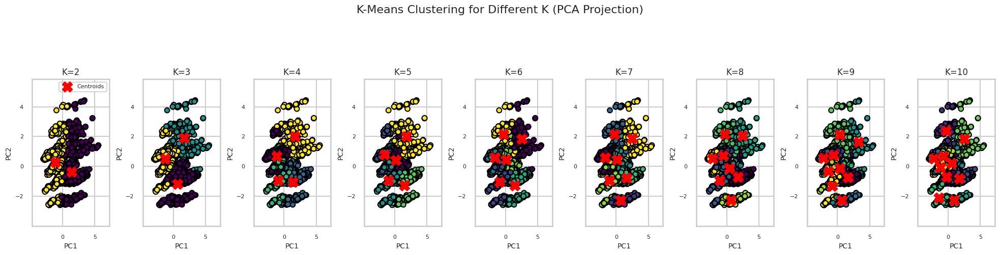

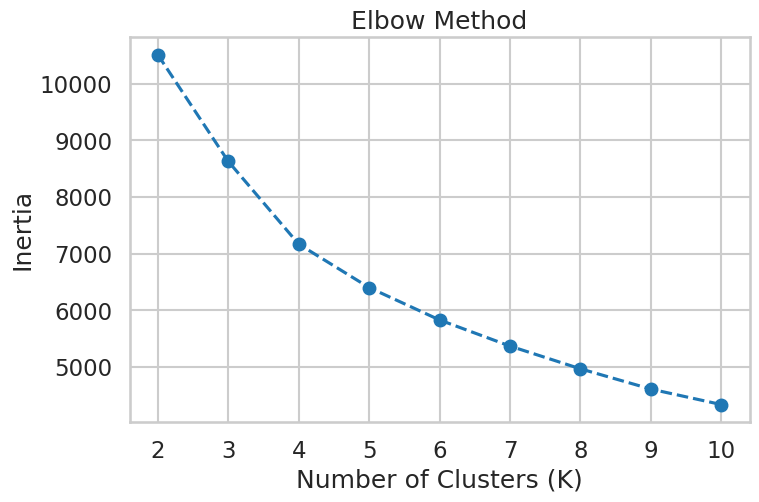

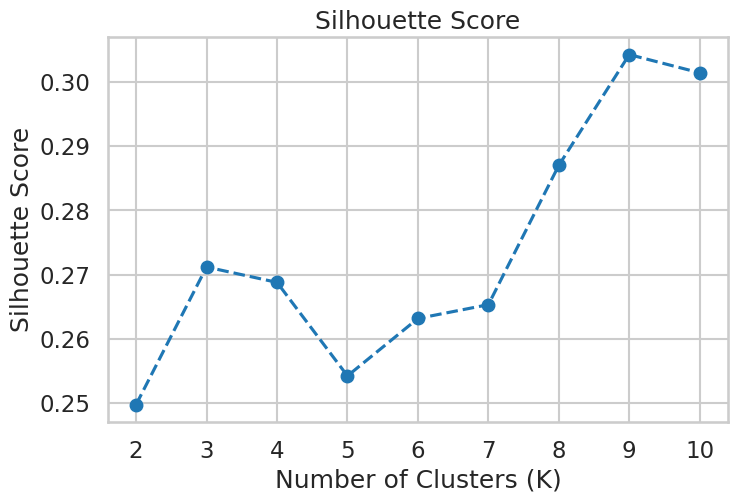


Silhouette Scores:
K=2: Silhouette Score = 0.250
K=3: Silhouette Score = 0.271
K=4: Silhouette Score = 0.269
K=5: Silhouette Score = 0.254
K=6: Silhouette Score = 0.263
K=7: Silhouette Score = 0.265
K=8: Silhouette Score = 0.287
K=9: Silhouette Score = 0.304
K=10: Silhouette Score = 0.301

Optimal number of clusters based on Silhouette Score: 9


In [65]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import pandas as pd

# PCA for Dimensionality Reduction (only for visualization)
pca = PCA(n_components=2)
X_pca = pca.fit_transform(scaled_cdf)

# Store sum of squared distances for elbow method
ssd = []
silhouette_scores = {}
k_values = range(2, 11)  # You can adjust the range of k

# Clustering & Visualization
# Clustering & Visualization
fig, axes = plt.subplots(1, len(k_values), figsize=(20, 5))  # Increased figure width and adjusted height

for i, k in enumerate(k_values):
    kmeans = KMeans(n_clusters=k, n_init=10, random_state=42)
    kmeans.fit(scaled_cdf)  # Fit on X_scaled
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    ssd.append(kmeans.inertia_)
    if k > 1:
        silhouette_avg = silhouette_score(scaled_cdf, labels)  # Calculate score on X_scaled
        silhouette_scores[k] = silhouette_avg
    centroids_pca = pca.transform(centroids)
    ax = axes[i]
    scatter = ax.scatter(X_pca[:, 0], X_pca[:, 1], c=labels, cmap='viridis', edgecolor='k', s=50)
    ax.scatter(centroids_pca[:, 0], centroids_pca[:, 1], marker='X', s=200, color='red', label='Centroids')
    ax.set_xlabel('PC1', fontsize=10)  # Adjusted font size
    ax.set_ylabel('PC2', fontsize=10)  # Adjusted font size
    ax.set_title(f'K={k}', fontsize=12)  # Adjusted font size
    ax.tick_params(axis='both', which='major', labelsize=8) # Adjusted tick label size
    if i == 0:
        ax.legend(loc='upper right', fontsize=8)
    ax.margins(0.2) # Increased margins within each subplot

plt.suptitle('K-Means Clustering for Different K (PCA Projection)', fontsize=16, y=1.05)
plt.tight_layout(rect=[0, 0.03, 1, 0.95], w_pad=0.5) # Increased w_pad for space between subplots
plt.show()

# Elbow Method Plot
plt.figure(figsize=(8, 5))
plt.plot(k_values, ssd, 'o--')
plt.xlabel("Number of Clusters (K)")
plt.ylabel("Inertia")
plt.title("Elbow Method")
plt.xticks(k_values)
plt.grid(True)
plt.show()

# Silhouette Score Plot
if silhouette_scores:
    plt.figure(figsize=(8, 5))
    plt.plot(silhouette_scores.keys(), silhouette_scores.values(), 'o--')
    plt.xlabel("Number of Clusters (K)")
    plt.ylabel("Silhouette Score")
    plt.title("Silhouette Score")
    plt.xticks(list(silhouette_scores.keys()))
    plt.grid(True)
    plt.show()

print("\nSilhouette Scores:")
for k, score in silhouette_scores.items():
    print(f"K={k}: Silhouette Score = {score:.3f}")

if silhouette_scores:
    optimal_k_silhouette = max(silhouette_scores, key=silhouette_scores.get)
    print(f"\nOptimal number of clusters based on Silhouette Score: {optimal_k_silhouette}")

# **Agglomerative Clustering**

Affinity: euclidean, Linkage: average, Threshold: 5 -> Clusters: 2, Silhouette: 0.3970


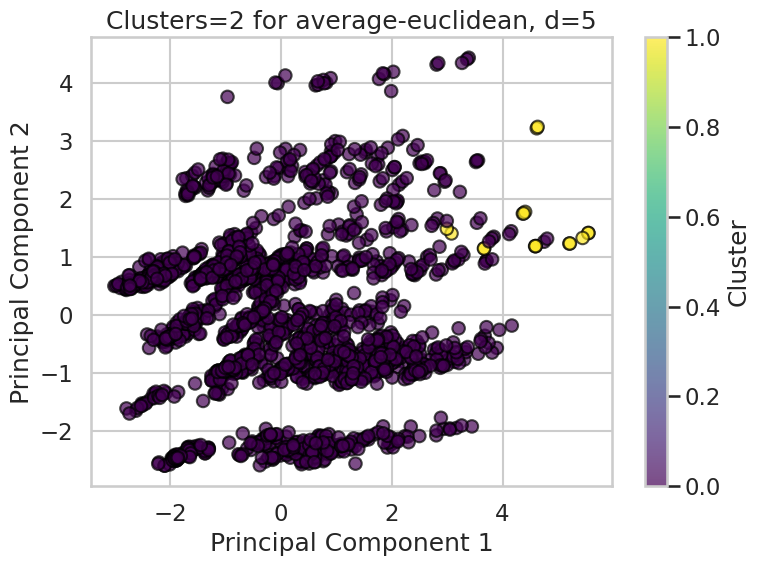

Affinity: euclidean, Linkage: complete, Threshold: 5 -> Clusters: 14, Silhouette: 0.1838


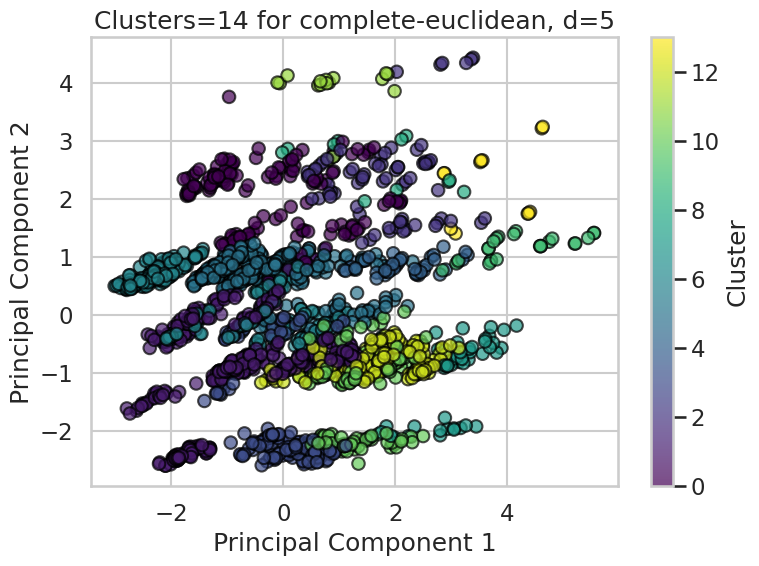

Affinity: euclidean, Linkage: ward, Threshold: 5 -> Clusters: 71, Silhouette: 0.4244


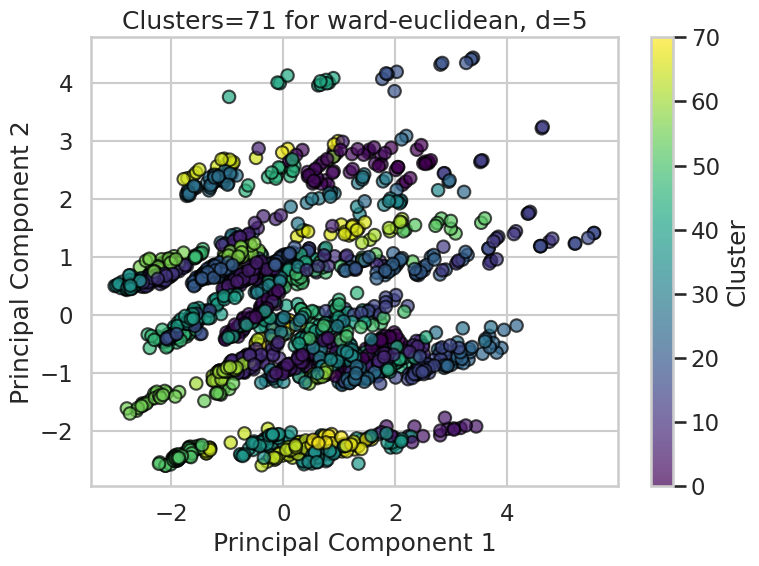

Affinity: euclidean, Linkage: ward, Threshold: 12 -> Clusters: 28, Silhouette: 0.4048


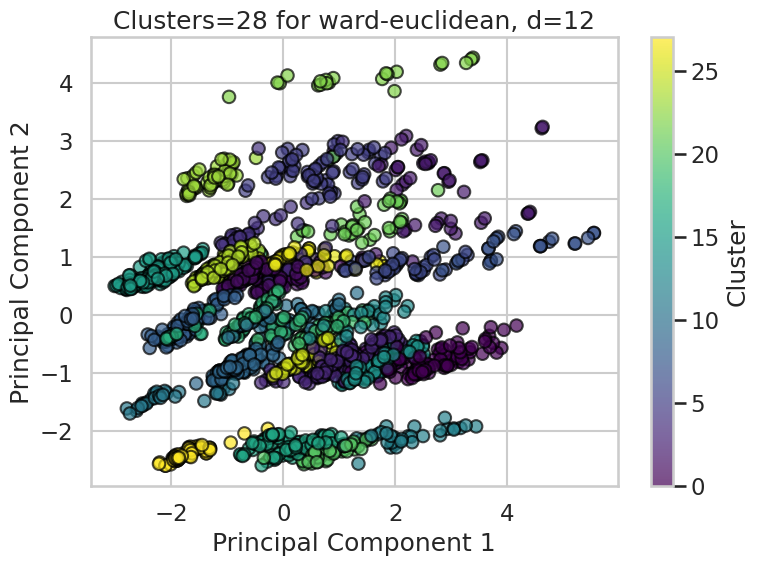

Affinity: euclidean, Linkage: ward, Threshold: 20 -> Clusters: 13, Silhouette: 0.3036


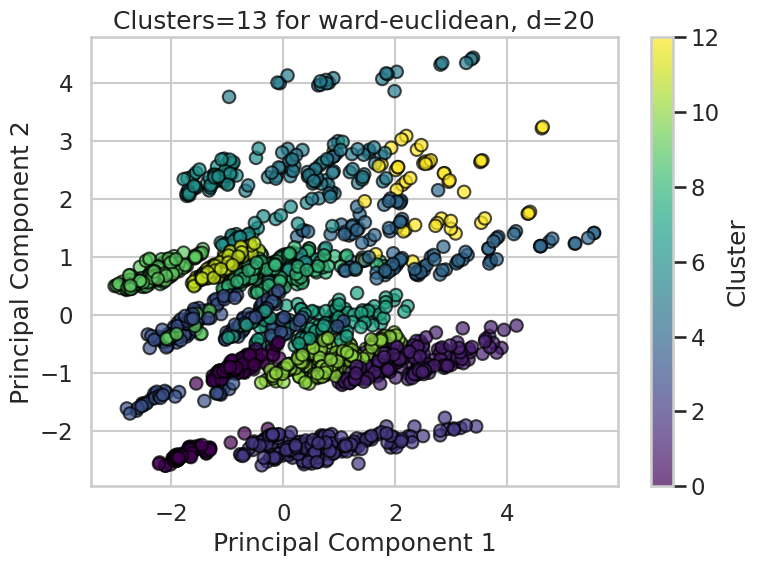

Affinity: manhattan, Linkage: average, Threshold: 5 -> Clusters: 16, Silhouette: 0.2745


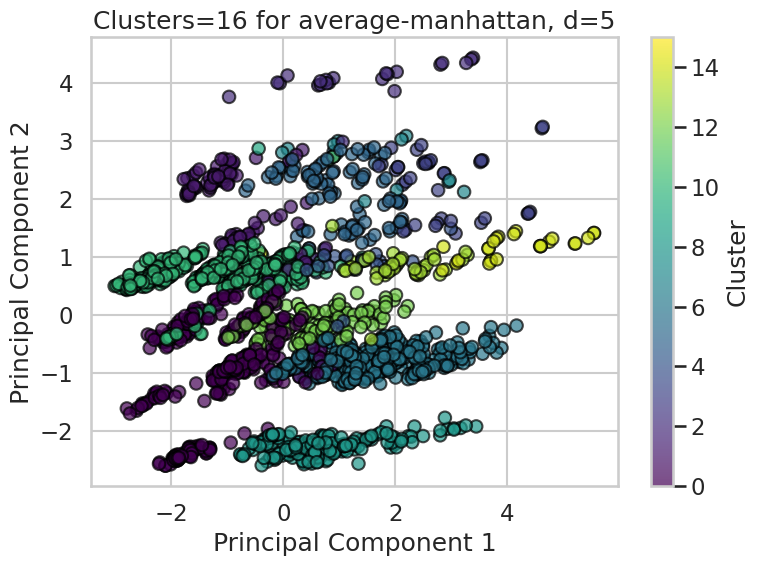

Affinity: manhattan, Linkage: complete, Threshold: 5 -> Clusters: 53, Silhouette: 0.4351


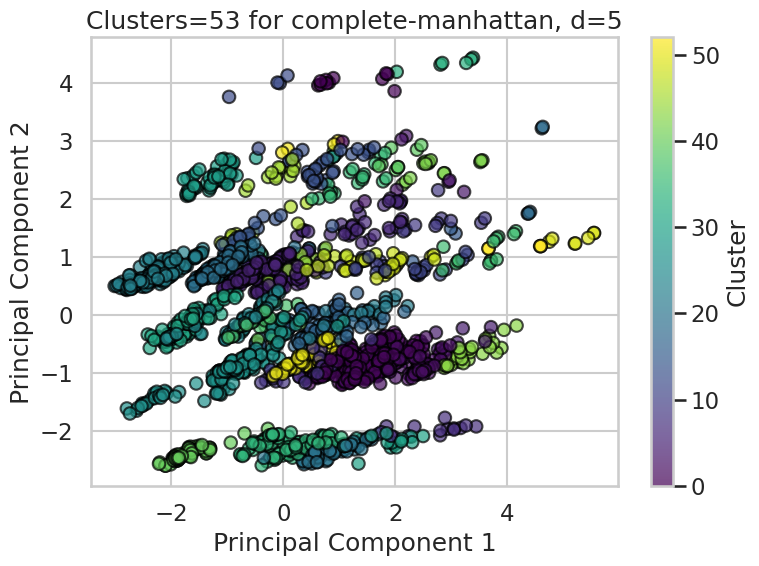

Affinity: manhattan, Linkage: complete, Threshold: 12 -> Clusters: 11, Silhouette: 0.2412


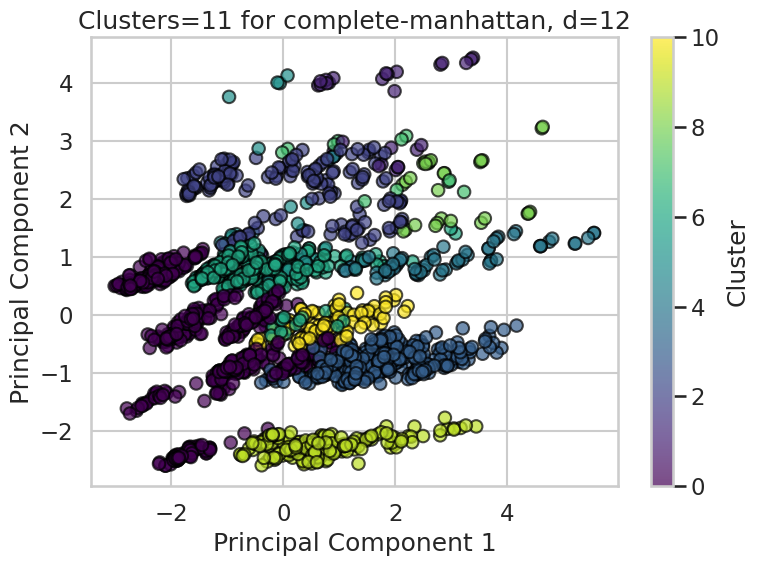

Affinity: manhattan, Linkage: complete, Threshold: 20 -> Clusters: 2, Silhouette: 0.2695


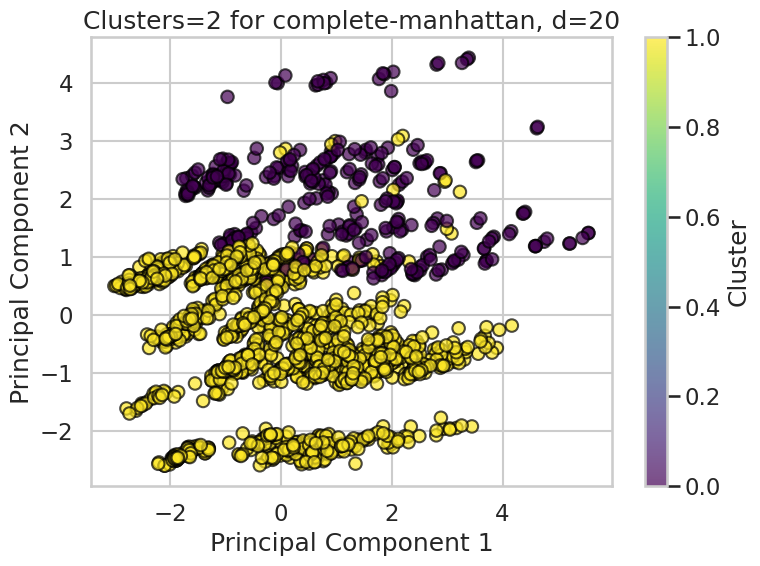


Optimal Agglomerative Clustering Parameters:
{'affinity': 'manhattan', 'linkage': 'complete', 'threshold': 5, 'silhouette': np.float64(0.4351001385135672), 'clusters': 53}


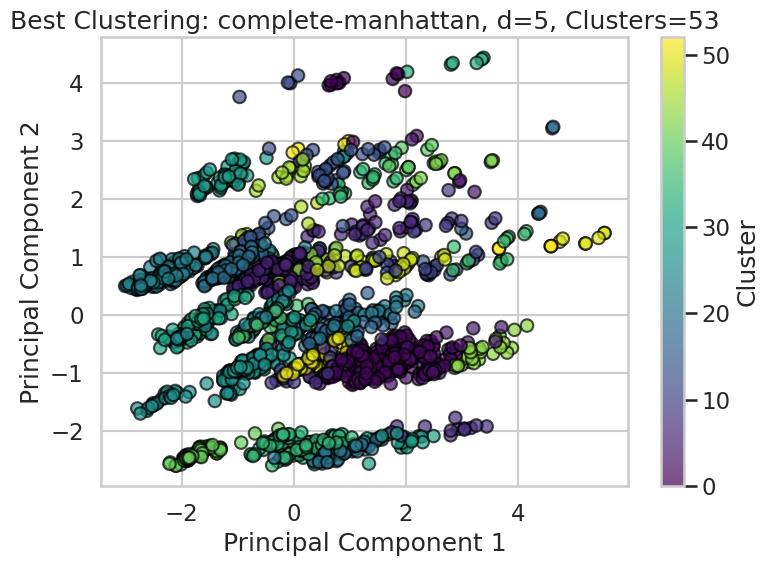

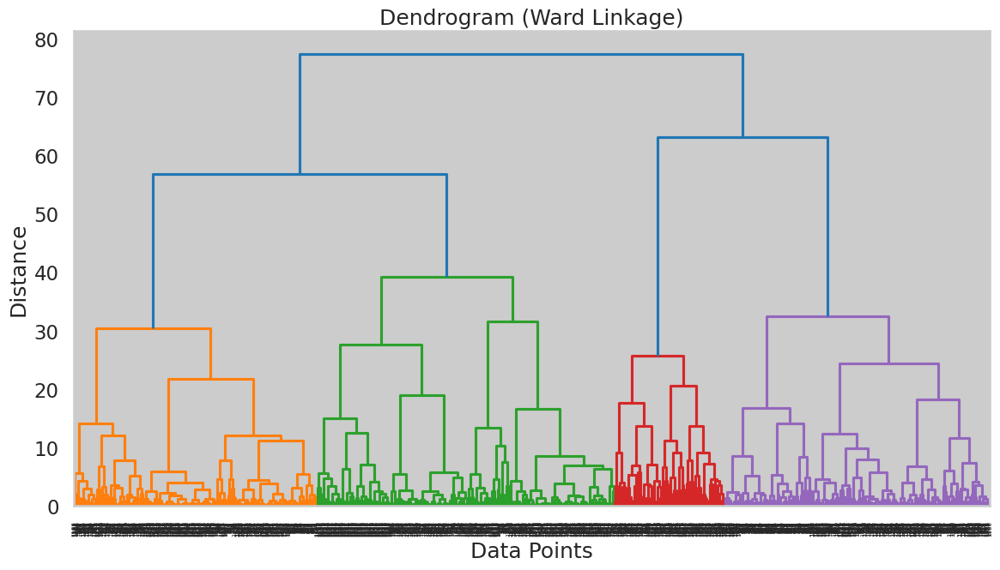

In [81]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import scipy.cluster.hierarchy as sch

# Define clustering parameters to explore
linkage_types = ["average", "single", "complete", "ward"]
affinity_types = ["euclidean", "manhattan", "cosine"]
threshold_values = [5, 12, 20]

# Variables to store the best clustering performance
top_silhouette = -1
optimal_parameters = {}
final_labels = None



# Apply PCA for 2D visualization
pca_visual = PCA(n_components=2)
reduced_data = pca_visual.fit_transform(scaled_cdf)

# Iterate through different clustering configurations
for affinity in affinity_types:
    for linkage in linkage_types:
        for threshold in threshold_values:
            # Ward linkage only works with Euclidean affinity
            if linkage == "ward" and affinity != "euclidean":
                continue

            # Create and fit the Agglomerative Clustering model
            agg_cluster = AgglomerativeClustering(n_clusters=None,
                                                  metric=affinity,
                                                  linkage=linkage,
                                                  distance_threshold=threshold)
            cluster_labels = agg_cluster.fit_predict(scaled_cdf)
            num_clusters = len(set(cluster_labels))

            # Evaluate using Silhouette Score if more than one cluster is formed
            if num_clusters > 1:
                silhouette_avg = silhouette_score(scaled_cdf, cluster_labels)
                print(f"Affinity: {affinity}, Linkage: {linkage}, Threshold: {threshold} -> Clusters: {num_clusters}, Silhouette: {silhouette_avg:.4f}")

                # Update best parameters if current configuration is better
                if silhouette_avg > top_silhouette:
                    top_silhouette = silhouette_avg
                    optimal_parameters = {
                        "affinity": affinity,
                        "linkage": linkage,
                        "threshold": threshold,
                        "silhouette": silhouette_avg,
                        "clusters": num_clusters
                    }
                    final_labels = cluster_labels

                # Visualize clustering result
                plt.figure(figsize=(8, 6))
                plt.scatter(reduced_data[:, 0], reduced_data[:, 1], c=cluster_labels, cmap='viridis', edgecolors='k', alpha=0.7)
                plt.title(f"Clusters={num_clusters} for {linkage}-{affinity}, d={threshold}")
                plt.xlabel("Principal Component 1")
                plt.ylabel("Principal Component 2")
                plt.colorbar(label="Cluster")
                plt.tight_layout()
                plt.show()

# Print the best clustering parameters
print("\nOptimal Agglomerative Clustering Parameters:")
print(optimal_parameters)

# Visualize the best clustering result
if final_labels is not None:
    plt.figure(figsize=(8, 6))
    plt.scatter(reduced_data[:, 0], reduced_data[:, 1], c=final_labels, cmap='viridis', edgecolors='k', alpha=0.7)
    plt.title(f"Best Clustering: {optimal_parameters['linkage']}-{optimal_parameters['affinity']}, d={optimal_parameters['threshold']}, Clusters={optimal_parameters['clusters']}")
    plt.xlabel("Principal Component 1")
    plt.ylabel("Principal Component 2")
    plt.colorbar(label="Cluster")
    plt.tight_layout()
    plt.show()

# Generate and plot a dendrogram for a single configuration (e.g., 'ward')
plt.figure(figsize=(12, 7))
linked_matrix = sch.linkage(scaled_cdf, method="ward")
sch.dendrogram(linked_matrix)
plt.title("Dendrogram (Ward Linkage)")
plt.xlabel("Data Points")
plt.ylabel("Distance")
plt.tight_layout()
plt.show()

## **DBSCAN Clustering **

Optimal EPS value: 1.610


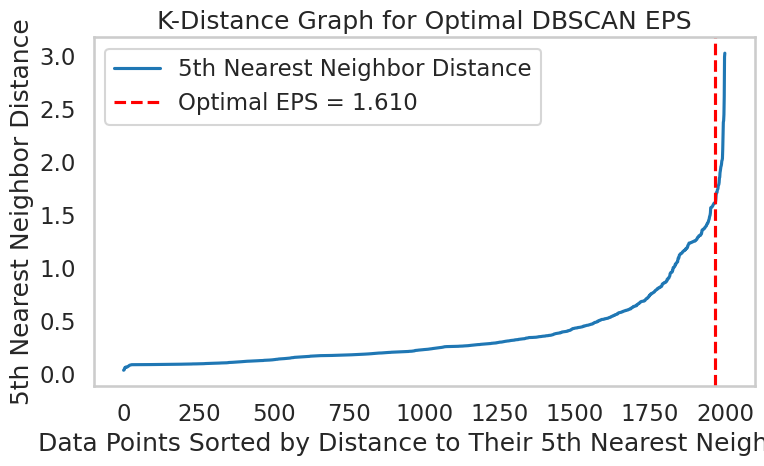

In [82]:
from kneed import KneeLocator
from sklearn.neighbors import NearestNeighbors
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler



# Determine the number of neighbors (k)
n_neighbors = 5

# Compute k-nearest neighbors distances
nearest_neighbors = NearestNeighbors(n_neighbors=n_neighbors)
nearest_neighbors.fit(scaled_cdf)
distances, indices = nearest_neighbors.kneighbors(scaled_cdf)

# Sort the distances of the k-th nearest neighbor
kth_distances = np.sort(distances[:, n_neighbors - 1])

# Use KneeLocator to find the optimal epsilon (eps)
knee_locator = KneeLocator(range(len(kth_distances)), kth_distances, curve="convex", direction="increasing")

# Extract the optimal eps value (y-value at the knee)
optimal_epsilon = kth_distances[knee_locator.knee] if knee_locator.knee is not None else None

print(f"Optimal EPS value: {optimal_epsilon:.3f}" if optimal_epsilon is not None else "Could not determine optimal EPS.")

# Plot the K-distance graph with the knee marked
plt.figure(figsize=(8, 5))
plt.plot(kth_distances, label=f"{n_neighbors}th Nearest Neighbor Distance")
if optimal_epsilon is not None:
    plt.axvline(knee_locator.knee, color="r", linestyle="--", label=f"Optimal EPS = {optimal_epsilon:.3f}")
plt.xlabel("Data Points Sorted by Distance to Their 5th Nearest Neighbor")
plt.ylabel(f"{n_neighbors}th Nearest Neighbor Distance")
plt.title("K-Distance Graph for Optimal DBSCAN EPS")
plt.legend()
plt.grid()
plt.tight_layout()
plt.show()

Eps: 0.10, Min Samples: 2, Clusters: 275, Noise: 866, Silhouette: -0.0857
Eps: 0.10, Min Samples: 5, Clusters: 39, Noise: 1542, Silhouette: -0.3343
Eps: 0.10, Min Samples: 8, Clusters: 14, Noise: 1820, Silhouette: -0.2420
Eps: 0.10, Min Samples: 11, Clusters: 0, Noise: 2000, Silhouette: Not Calculated
Eps: 0.10, Min Samples: 14, Clusters: 0, Noise: 2000, Silhouette: Not Calculated
Eps: 0.10, Min Samples: 17, Clusters: 0, Noise: 2000, Silhouette: Not Calculated
Eps: 0.10, Min Samples: 20, Clusters: 0, Noise: 2000, Silhouette: Not Calculated
Eps: 0.10, Min Samples: 23, Clusters: 0, Noise: 2000, Silhouette: Not Calculated
Eps: 0.10, Min Samples: 26, Clusters: 0, Noise: 2000, Silhouette: Not Calculated
Eps: 0.10, Min Samples: 29, Clusters: 0, Noise: 2000, Silhouette: Not Calculated
Eps: 0.36, Min Samples: 2, Clusters: 142, Noise: 140, Silhouette: 0.3688
Eps: 0.36, Min Samples: 5, Clusters: 45, Noise: 452, Silhouette: 0.2684
Eps: 0.36, Min Samples: 8, Clusters: 34, Noise: 617, Silhouette: 0

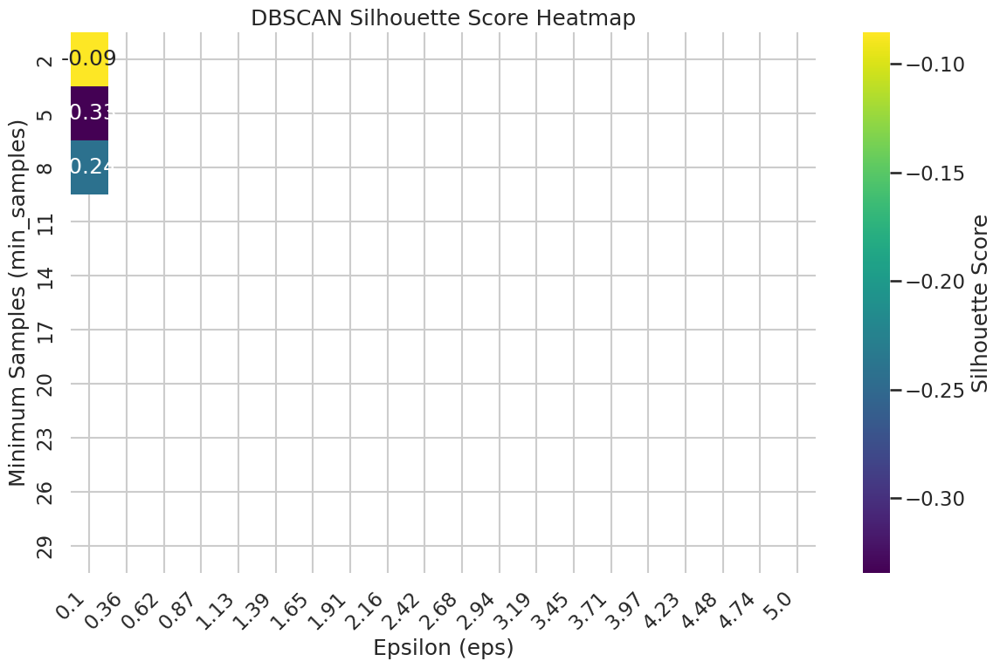


Best DBSCAN Parameters:
Optimal EPS: 0.874
Optimal Min Samples: 2
Number of Clusters: 91
Best Silhouette Score: 0.4728


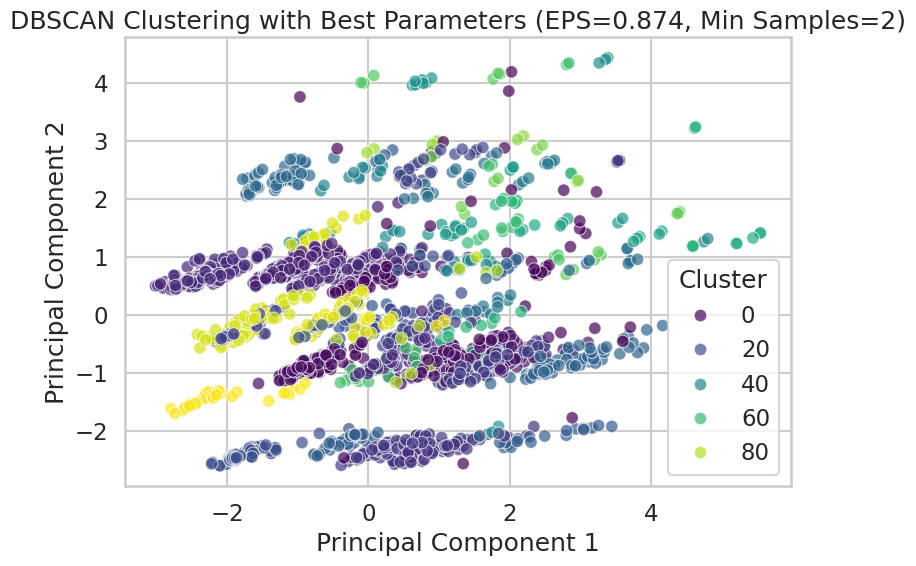

In [83]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score
from itertools import product
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler



# Define wider ranges for DBSCAN parameters
epsilon_values = np.linspace(0.1, 5, 20)  # Wider EPS range
min_samples_range = range(2, 30, 3)      # More granular Min Samples

# Store evaluation results
evaluation_results = []
top_score = -1
optimal_parameters = None

# Explore different parameter combinations
for epsilon, min_samples in product(epsilon_values, min_samples_range):
    dbscan_model = DBSCAN(eps=epsilon, min_samples=min_samples)
    cluster_assignments = dbscan_model.fit_predict(scaled_cdf)
    num_distinct_clusters = len(set(cluster_assignments))
    num_noise_points = list(cluster_assignments).count(-1)
    num_actual_clusters = num_distinct_clusters - (1 if -1 in cluster_assignments else 0)

    # Evaluate silhouette score if more than one REAL cluster is formed
    if num_actual_clusters > 1 and num_actual_clusters < len(scaled_cdf):
        silhouette_avg = silhouette_score(scaled_cdf, cluster_assignments)
        evaluation_results.append((epsilon, min_samples, silhouette_avg, num_actual_clusters))

        # Track the best performing parameters
        if silhouette_avg > top_score:
            top_score = silhouette_avg
            optimal_parameters = (epsilon, min_samples, num_actual_clusters)

        print(f"Eps: {epsilon:.2f}, Min Samples: {min_samples}, Clusters: {num_actual_clusters}, Noise: {num_noise_points}, Silhouette: {silhouette_avg:.4f}")
    else:
        print(f"Eps: {epsilon:.2f}, Min Samples: {min_samples}, Clusters: {num_actual_clusters}, Noise: {num_noise_points}, Silhouette: Not Calculated")

# Convert results to a structured array for easier handling
results_array = np.array(evaluation_results, dtype=object)

# Prepare data for heatmap visualization
heatmap_grid = np.full((len(min_samples_range), len(epsilon_values)), np.nan)
min_samples_labels = list(min_samples_range)
epsilon_labels = np.round(epsilon_values, 2)

for i, min_sample_val in enumerate(min_samples_labels):
    for j, eps_val in enumerate(epsilon_labels):
        relevant_results = results_array[(results_array[:, 0] == eps_val) & (results_array[:, 1] == min_sample_val)]
        if relevant_results.size > 0:
            heatmap_grid[i, j] = relevant_results[0, 2]  # Silhouette score

# Generate the Silhouette Score heatmap
plt.figure(figsize=(12, 8))  # Increased figure size for better readability
sns.heatmap(heatmap_grid, xticklabels=epsilon_labels, yticklabels=min_samples_labels,
            cmap="viridis", annot=True, fmt=".2f", cbar_kws={'label': 'Silhouette Score'})
plt.xlabel("Epsilon (eps)")
plt.ylabel("Minimum Samples (min_samples)")
plt.title("DBSCAN Silhouette Score Heatmap")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

# Display the parameters that yielded the best Silhouette Score
print("\nBest DBSCAN Parameters:")
if optimal_parameters:
    print(f"Optimal EPS: {optimal_parameters[0]:.3f}")
    print(f"Optimal Min Samples: {optimal_parameters[1]}")
    print(f"Number of Clusters: {optimal_parameters[2]}")
    print(f"Best Silhouette Score: {top_score:.4f}")
else:
    print("No valid clustering with more than one cluster found for Silhouette Score calculation.")

# Visualize the clustering with the best parameters using PCA
if optimal_parameters:
    best_eps, best_min_samps, _ = optimal_parameters
    final_dbscan_model = DBSCAN(eps=best_eps, min_samples=best_min_samps)
    final_cluster_labels = final_dbscan_model.fit_predict(scaled_cdf)

    pca_visualizer = PCA(n_components=2)
    principal_components = pca_visualizer.fit_transform(scaled_cdf)

    plt.figure(figsize=(8, 6))
    sns.scatterplot(x=principal_components[:, 0], y=principal_components[:, 1], hue=final_cluster_labels, palette='viridis', alpha=0.7)
    plt.title(f"DBSCAN Clustering with Best Parameters (EPS={best_eps:.3f}, Min Samples={best_min_samps})")
    plt.xlabel("Principal Component 1")
    plt.ylabel("Principal Component 2")
    plt.legend(title="Cluster")
    plt.tight_layout()
    plt.show()

In [ ]:
# DBScan yielded 53 clusters as the best result with a silhouette score of 0.4728